In [1]:
library(tidyverse)
library(maps)
library(forcats)
library(caret)
library(DT)

── Attaching packages ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.2     ✔ dplyr   1.0.7
✔ tidyr   1.1.3     ✔ stringr 1.4.0
✔ readr   1.4.0     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘maps’


The following object is masked from ‘package:purrr’:

    map


Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift




In [2]:
df_pulsar <- read_csv("HTRU_2.csv", col_names = FALSE)

names(df_pulsar) <- c("integ_mean","integ_sd","integ_exkur","integ_skew",
                      "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

df_pulsar <- df_pulsar %>% select(everything()) %>% mutate(Class = ifelse(Class == 1, "Pulsar", "Non Pulsar"))

df_pulsar$Class <- as.factor(df_pulsar$Class)


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double(),
  X4 = col_double(),
  X5 = col_double(),
  X6 = col_double(),
  X7 = col_double(),
  X8 = col_double(),
  X9 = col_double()
)




tibble [17,898 × 9] (S3: tbl_df/tbl/data.frame)
 $ integ_mean : num [1:17898] 140.6 102.5 103 136.8 88.7 ...
 $ integ_sd   : num [1:17898] 55.7 58.9 39.3 57.2 40.7 ...
 $ integ_exkur: num [1:17898] -0.2346 0.4653 0.3233 -0.0684 0.6009 ...
 $ integ_skew : num [1:17898] -0.7 -0.515 1.051 -0.636 1.123 ...
 $ DMSNR_mean : num [1:17898] 3.2 1.68 3.12 3.64 1.18 ...
 $ DMSNR_sd   : num [1:17898] 19.1 14.9 21.7 21 11.5 ...
 $ DMSNR_exkur: num [1:17898] 7.98 10.58 7.74 6.9 14.27 ...
 $ DMSNR_skew : num [1:17898] 74.2 127.4 63.2 53.6 252.6 ...
 $ Class      : Factor w/ 2 levels "Non Pulsar","Pulsar": 1 1 1 1 1 1 1 1 1 1 ...
NULL


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



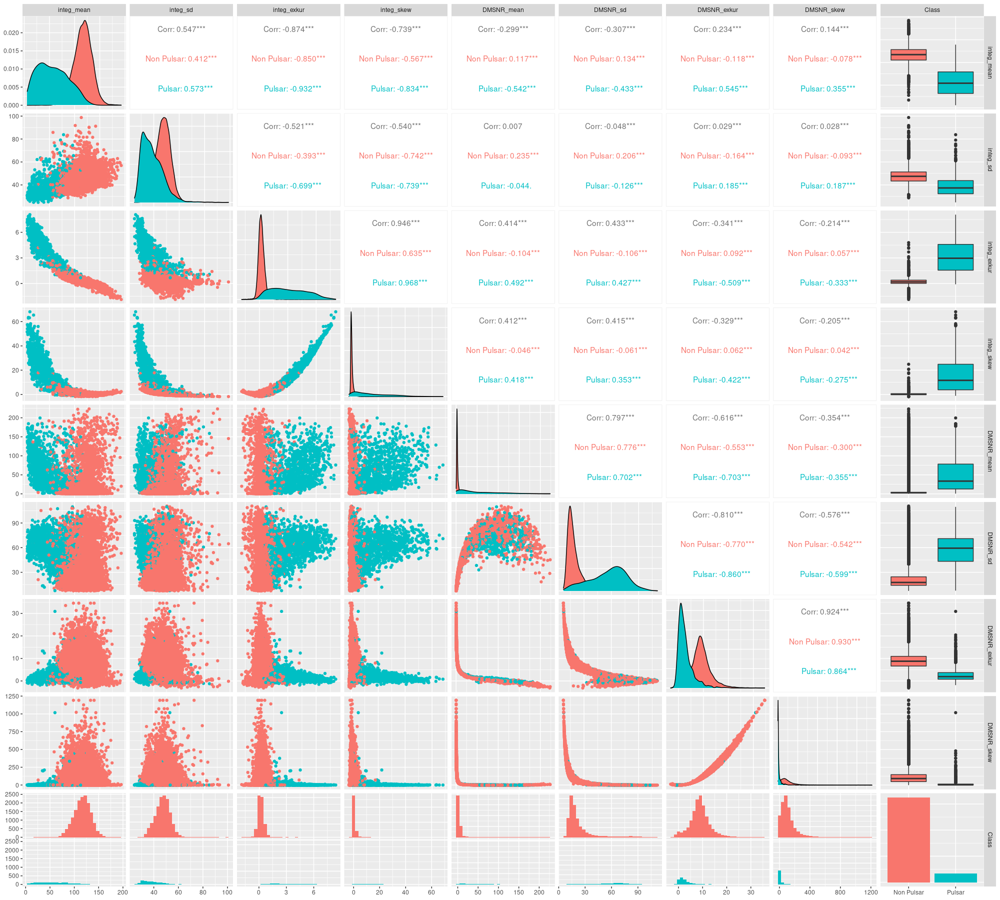

In [3]:
print(str(df_pulsar))

options(repr.plot.width = 20, repr.plot.height = 18, repr.plot.res = 100)

dense_colors <- c('#a6cee3','#1f78b4','#b2df8a','#33a02c', 
                  '#ca0020','#f4a582','#bababa','#404040')

GGally::ggpairs(df_pulsar, mapping = ggplot2::aes(color = Class))

In [4]:
short_names <- list("integ_mean","integ_sd","integ_exkur","integ_skew",
                    "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

proper_names <-  c("Integrated Mean", "Integrated Standard Deviation", 
                   "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                   "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

#names_list <- list(short_names)

names(short_names) <- c(proper_names, "Class")

print(short_names)

$`Integrated Mean`
[1] "integ_mean"

$`Integrated Standard Deviation`
[1] "integ_sd"

$`Integrated Kurtosis`
[1] "integ_exkur"

$`Intergrated Skew`
[1] "integ_skew"

$`DMSNR Mean`
[1] "DMSNR_mean"

$`DMSNR Standard Deviation`
[1] "DMSNR_sd"

$`DMSNR Kurtosis`
[1] "DMSNR_exkur"

$`DMSNR Skew`
[1] "DMSNR_skew"

$Class
[1] "Class"



In [5]:
var_list <- names(df_pulsar)[1:5]

df_pulsar %>% select(all_of(var_list)) %>% filter(integ_mean <= 10) %>% datatable()

HTML widgets cannot be represented in plain text (need html)

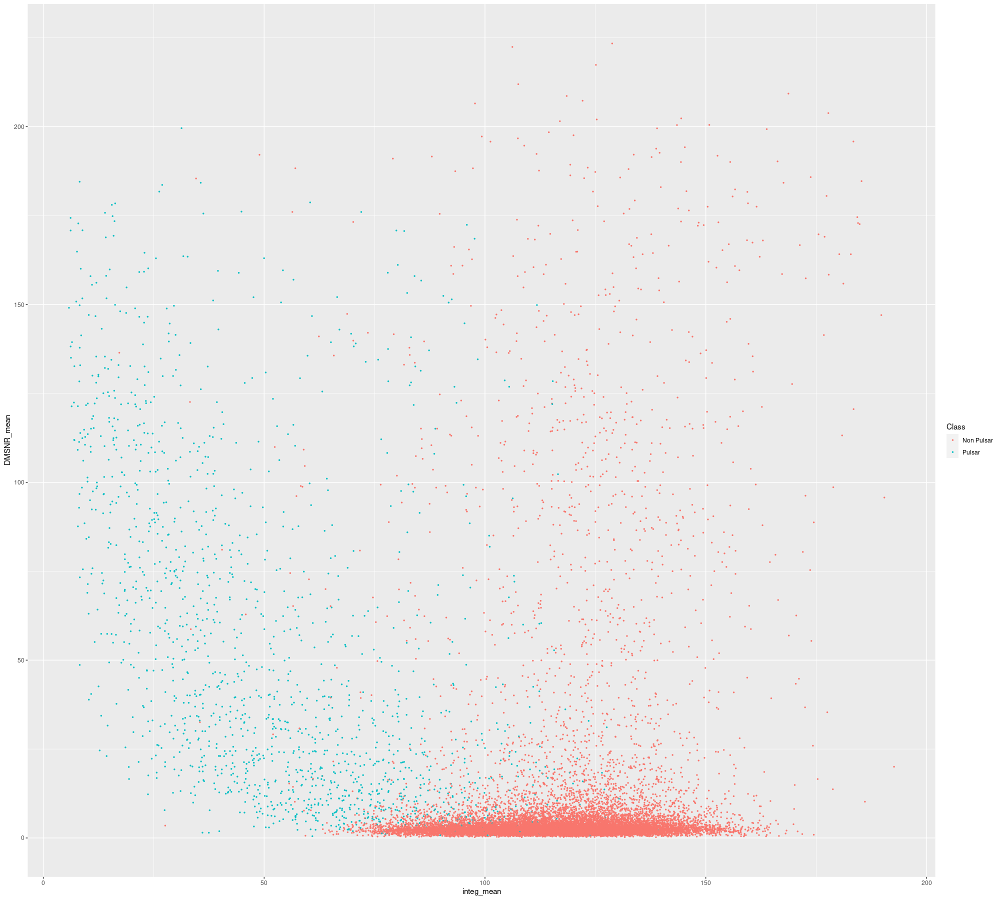

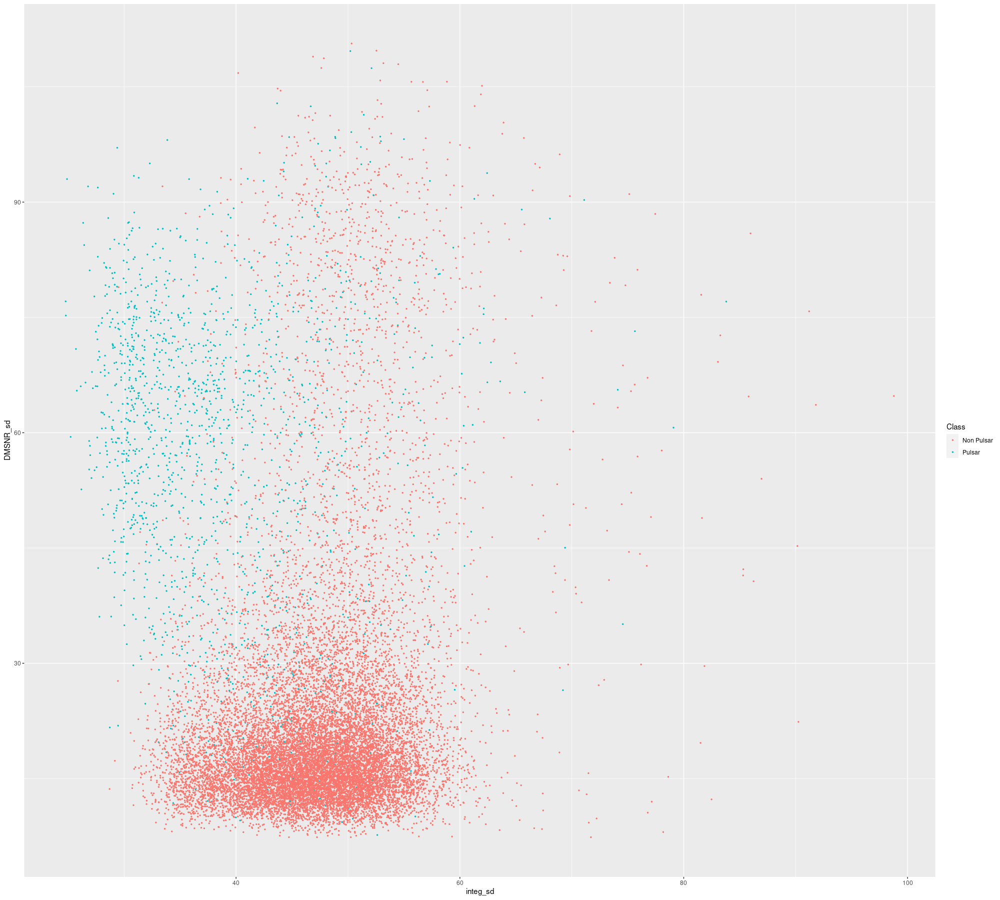

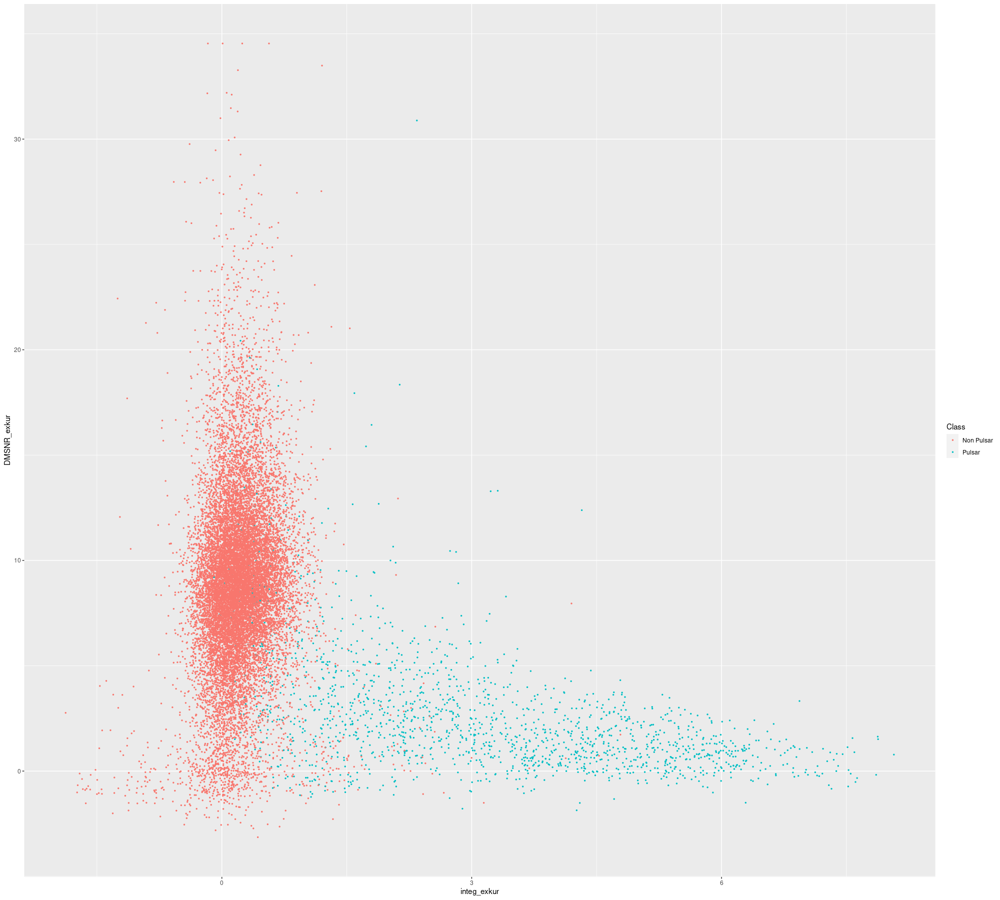

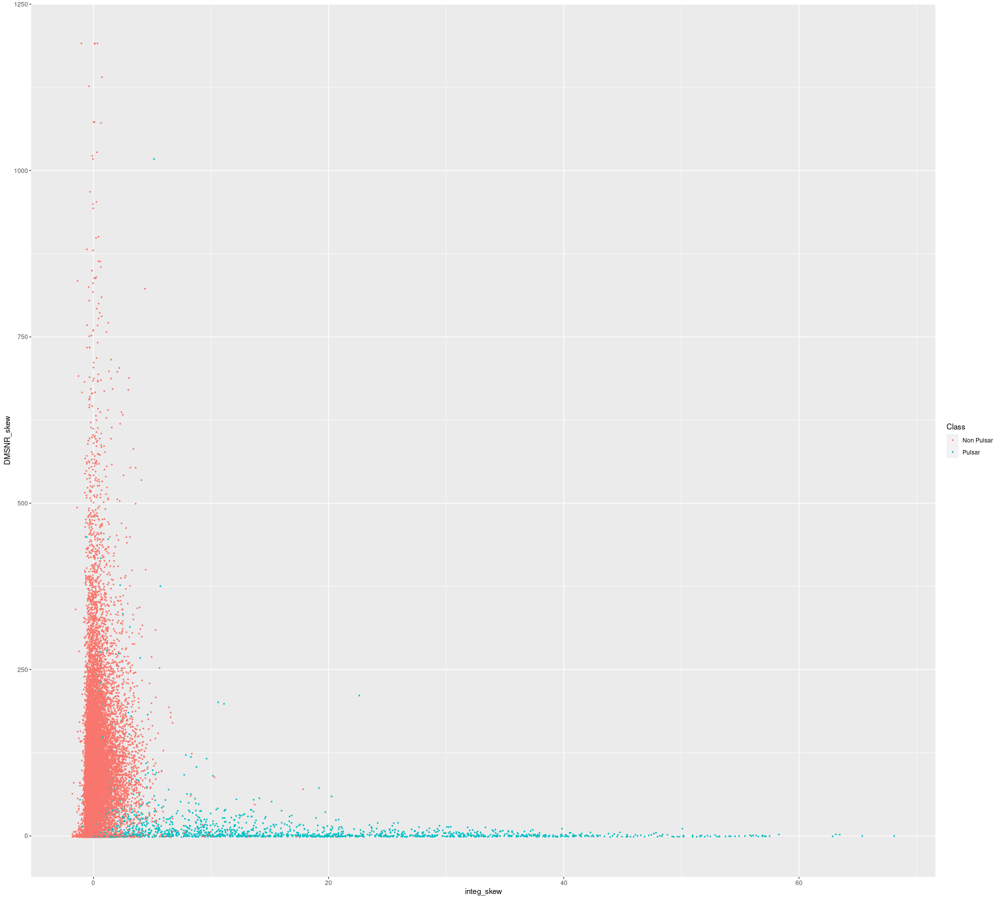

In [6]:
ggplot(df_pulsar, aes(x = integ_mean, y = DMSNR_mean, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_sd, y = DMSNR_sd, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_exkur, y = DMSNR_exkur, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_skew, y = DMSNR_skew, col = Class)) +
  geom_point(size = 0.5)

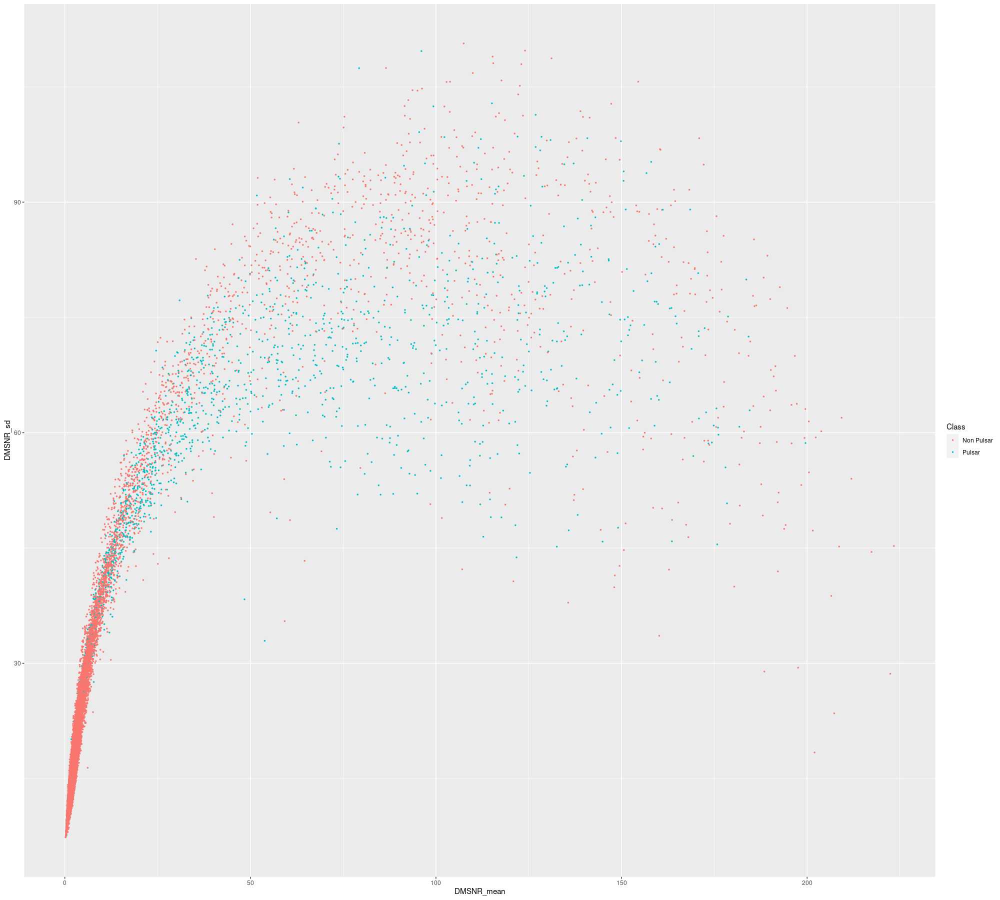

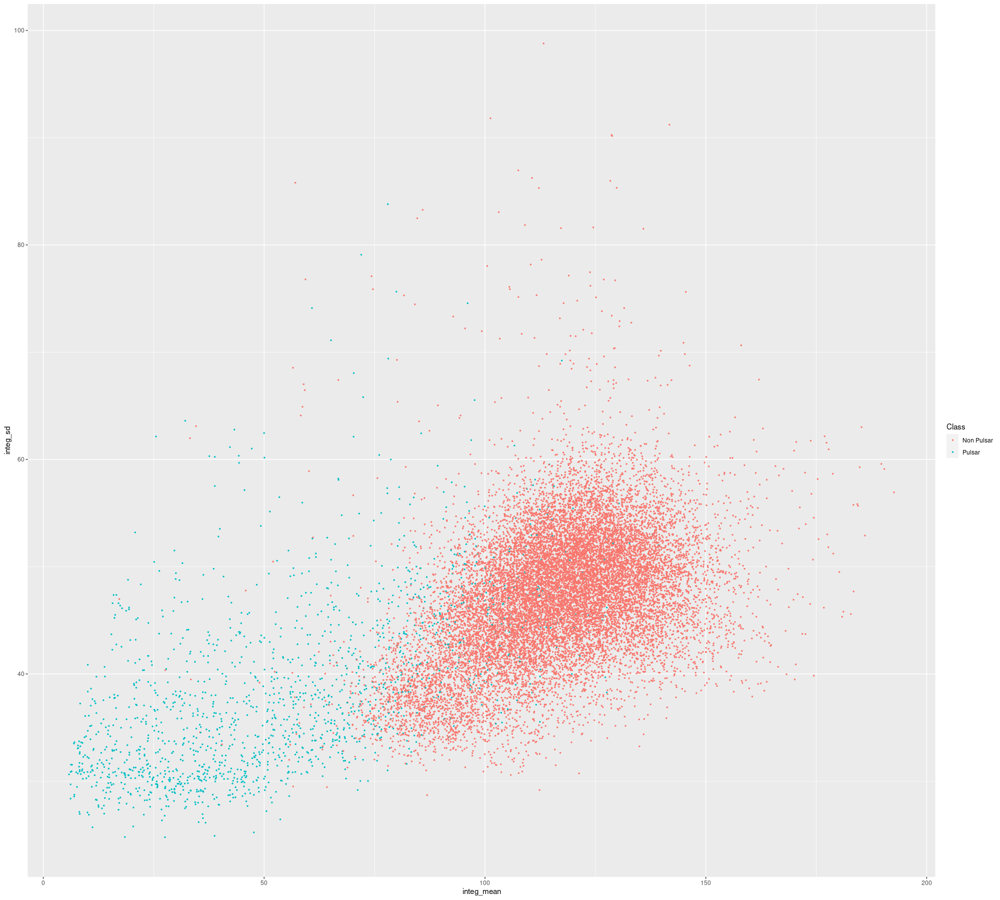

In [7]:
ggplot(df_pulsar, aes(x = DMSNR_mean, y = DMSNR_sd, col = Class)) +
  geom_point(size = 0.5)

ggplot(df_pulsar, aes(x = integ_mean, y = integ_sd, col = Class)) +
  geom_point(size = 0.5)

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”
Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


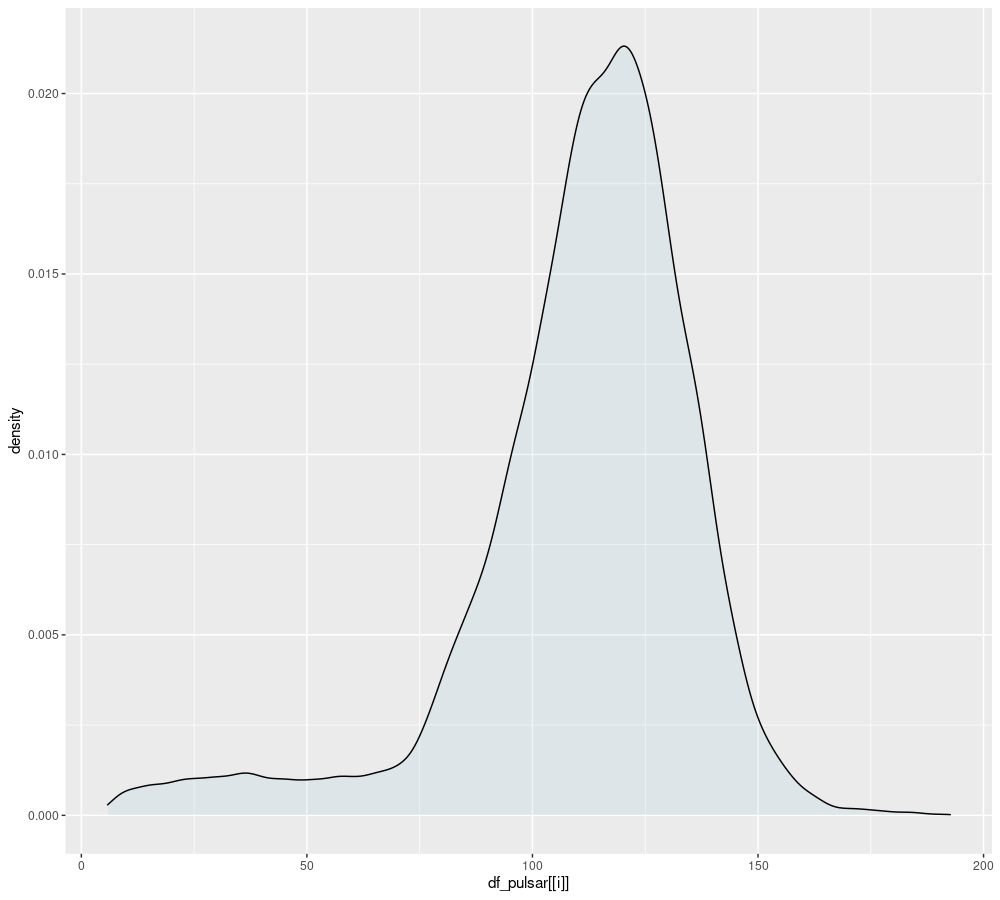

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


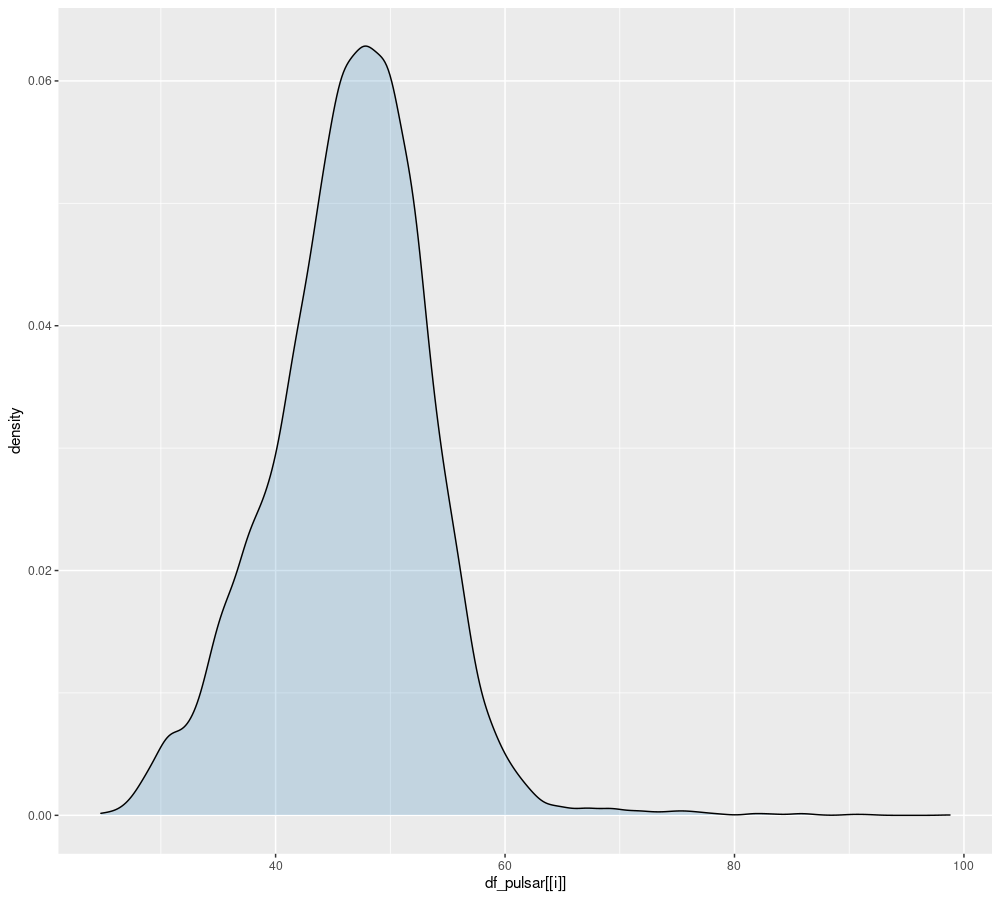

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


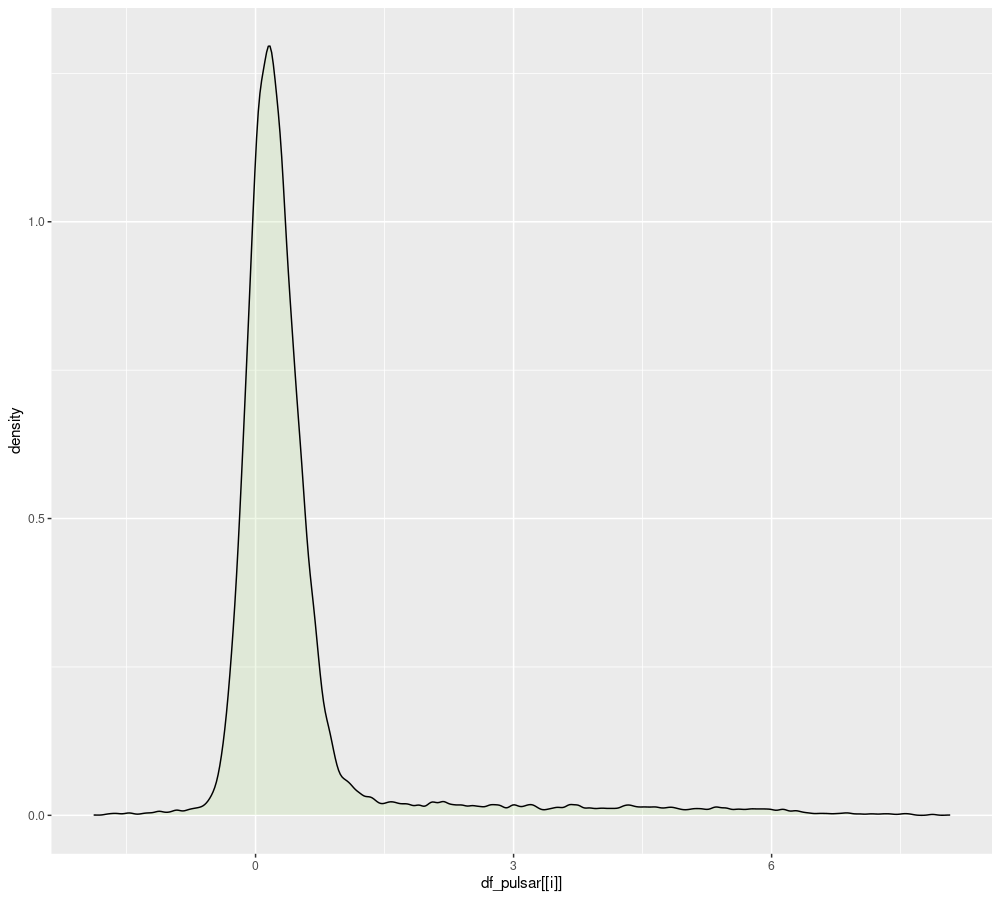

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


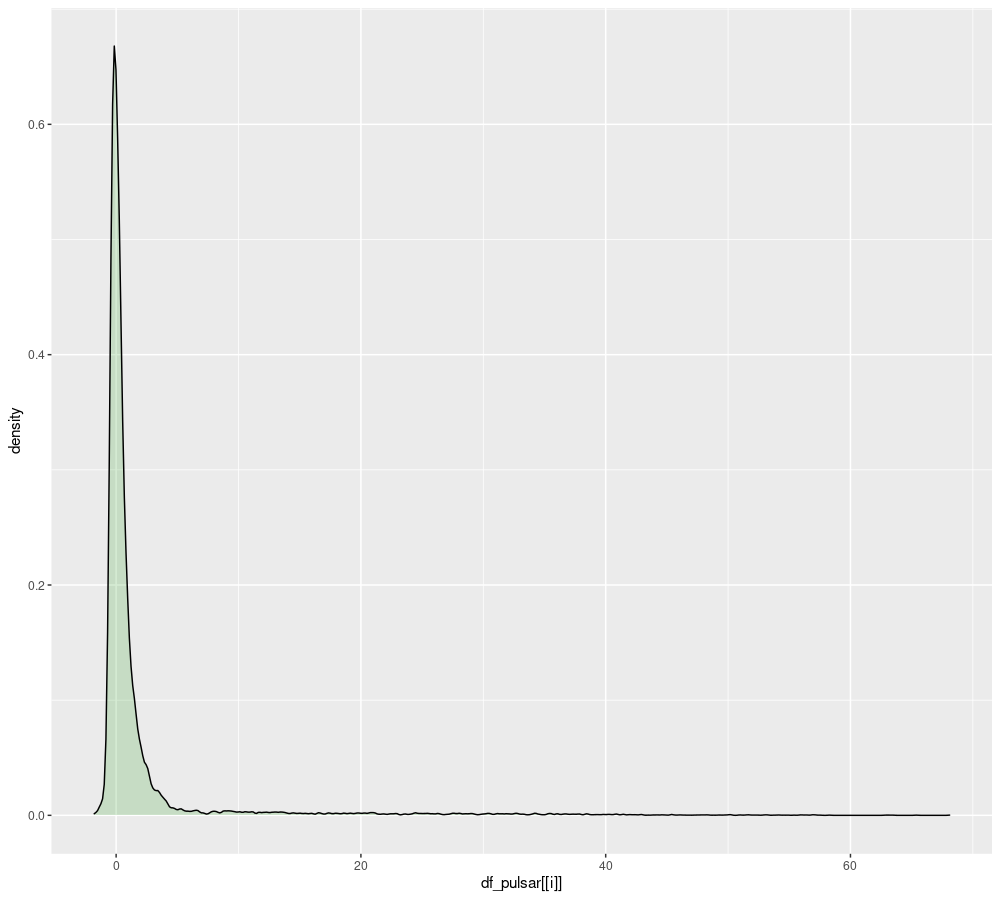

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


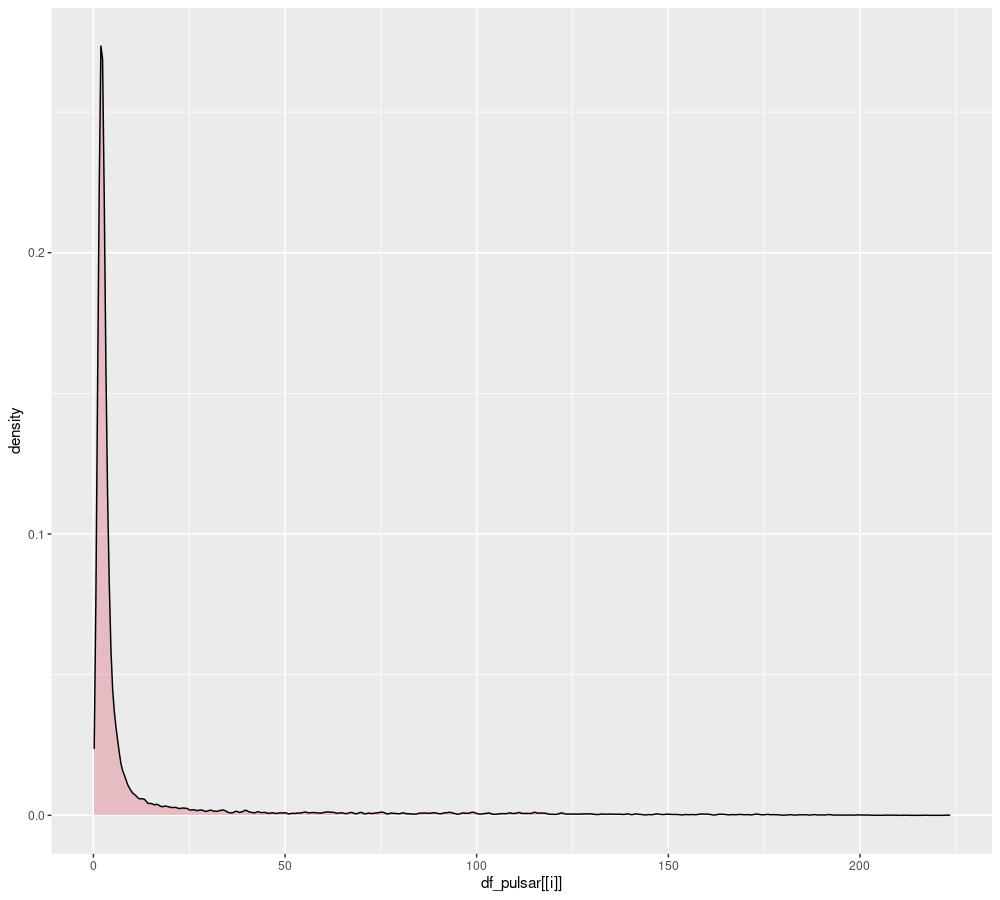

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


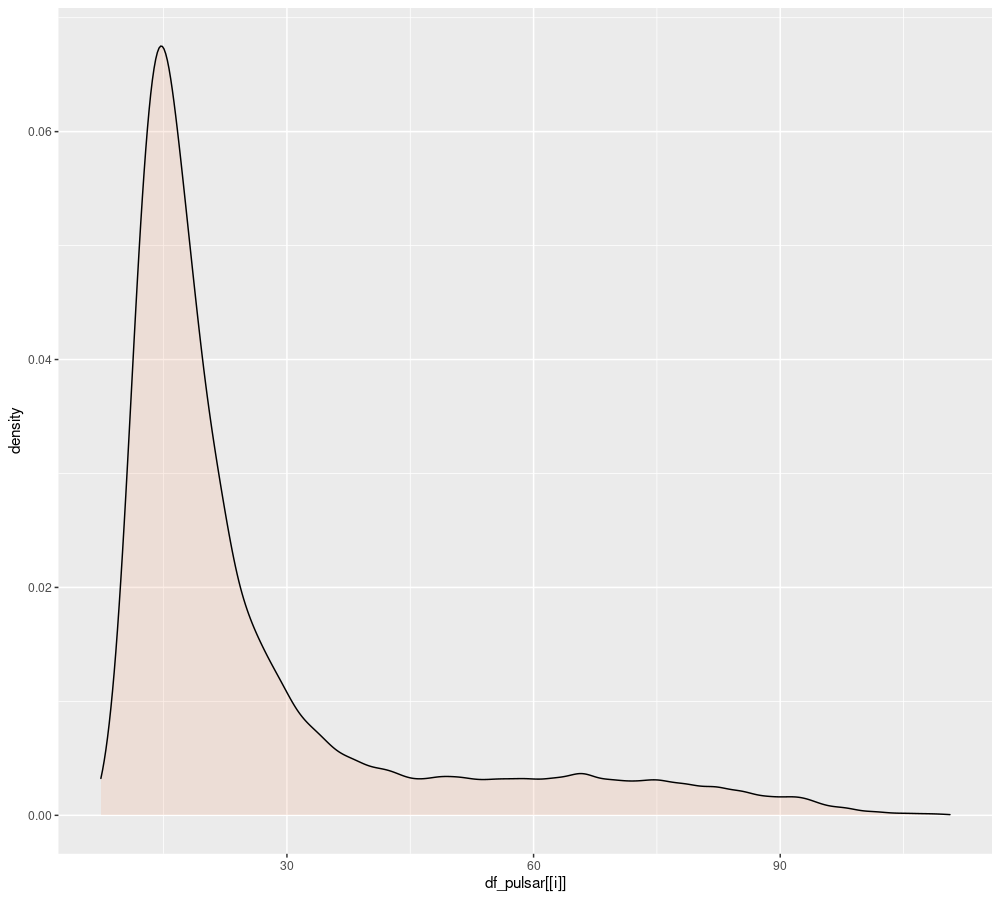

Warning message:
“Use of `df_pulsar[[i]]` is discouraged. Use `.data[[i]]` instead.”


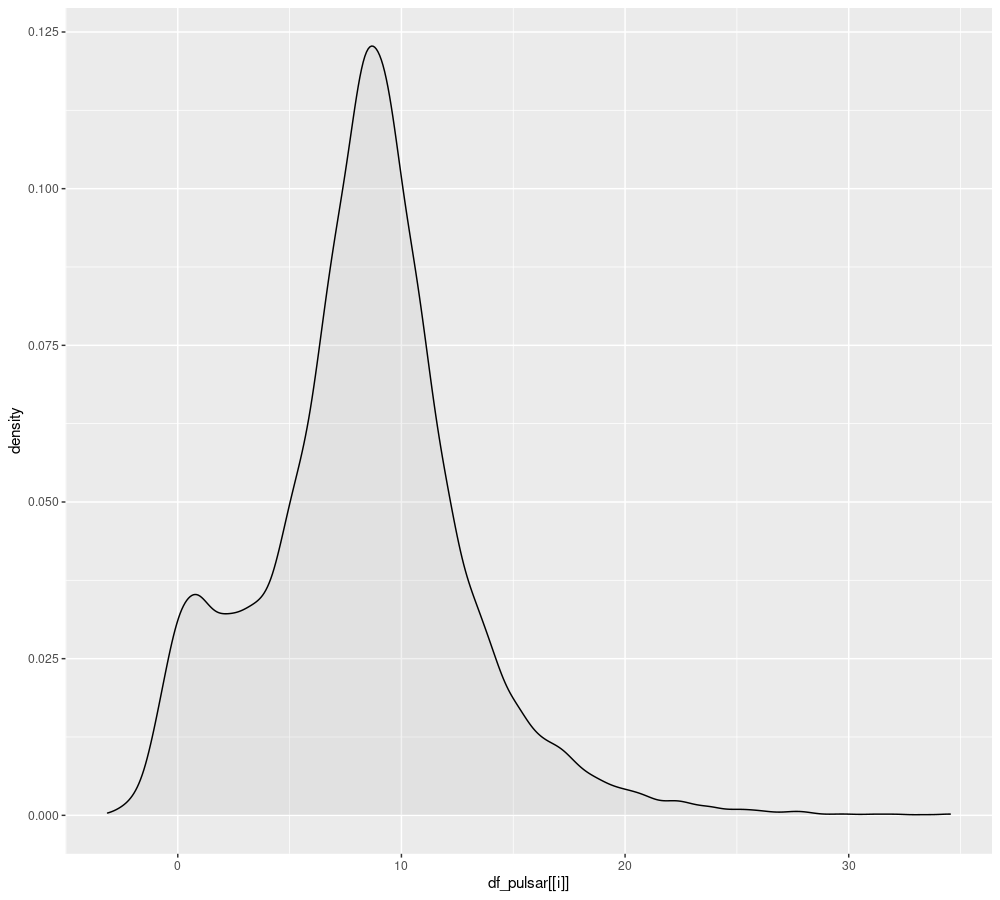

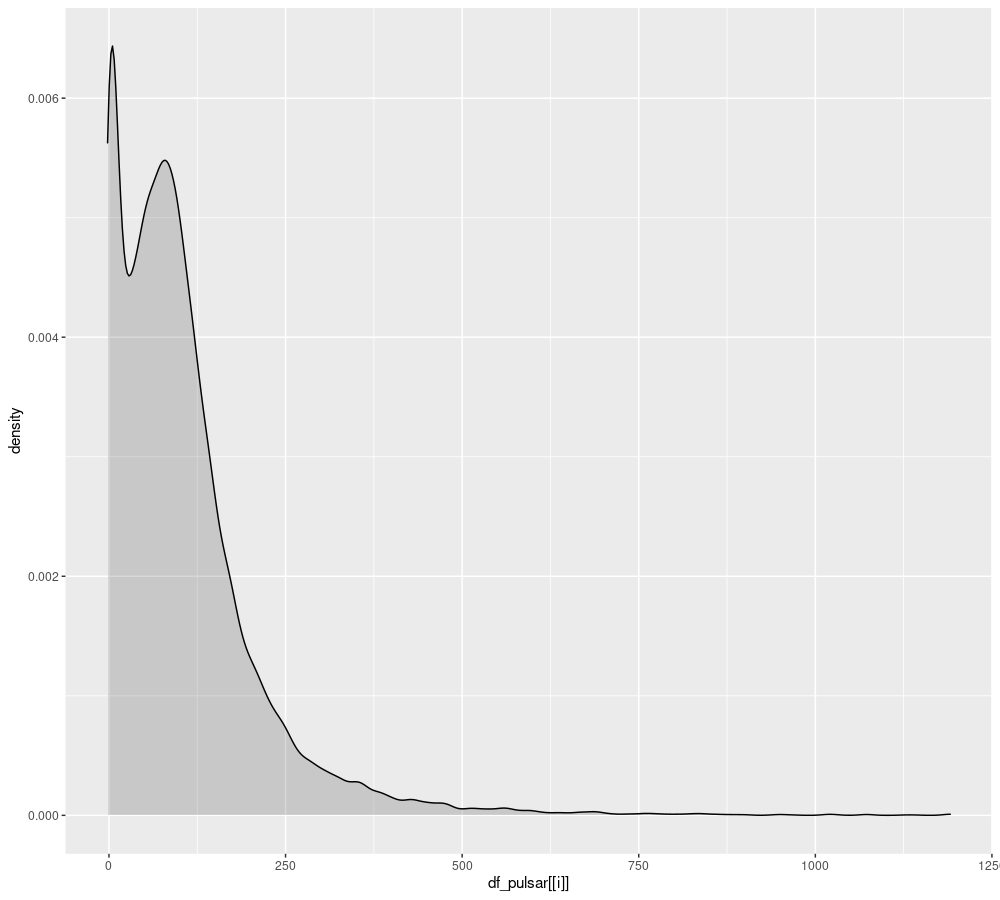

In [8]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

dense_colors <- c('#a6cee3','#1f78b4','#b2df8a','#33a02c', 
                  '#ca0020','#f4a582','#bababa','#404040')


for(i in 1:4){
    pulsar_plot <-
    ggplot(data = df_pulsar) +
    geom_density(aes(x = df_pulsar[[i]]), alpha = .2, fill = dense_colors[i])
    print(pulsar_plot)
}

for(i in 5:8){
    pulsar_plot <-
    ggplot(df_pulsar) +
    geom_density(aes(x = df_pulsar[[i]]), alpha = .2, fill = dense_colors[i])
    print(pulsar_plot)
}

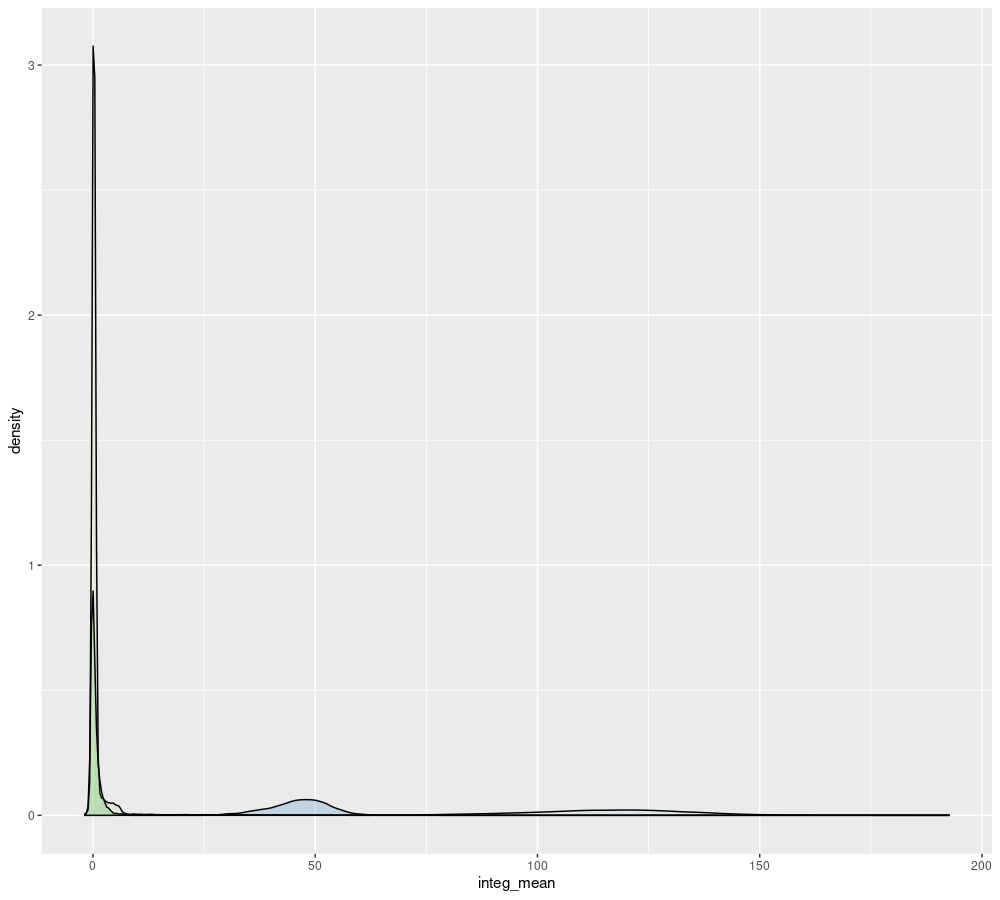

In [9]:
ggplot(df_pulsar) +
    geom_density(aes(x = integ_mean), alpha = .2, fill = dense_colors[1]) +
    geom_density(aes(x = integ_sd), alpha = .2, fill = dense_colors[2]) +
    geom_density(aes(x = integ_exkur), alpha = .2, fill = dense_colors[3]) +
    geom_density(aes(x = integ_skew), alpha = .2, fill = dense_colors[4]) 

In [10]:
set.seed(1)
training <- sample(1:nrow(df_pulsar), size = nrow(df_pulsar) * 0.5)
testing <- dplyr::setdiff(1:nrow(df_pulsar), training)
pulsarTrain <- df_pulsar[training, ]
pulsarTest <- df_pulsar[testing, ]

In [11]:
print(names(df_pulsar))

[1] "integ_mean"  "integ_sd"    "integ_exkur" "integ_skew"  "DMSNR_mean" 
[6] "DMSNR_sd"    "DMSNR_exkur" "DMSNR_skew"  "Class"      


In [12]:
trctrl <- trainControl(method = "repeatedcv", 
                       number = 5, 
                       repeats = 2)

set.seed(2020)

knn_fit1 <- train(Class ~ ., 
                  data = pulsarTrain,
                  method = "knn", 
                  trControl = trctrl, 
                  preProcess = c("center", "scale"), 
                  tuneGrid = data.frame(k = 2:30))

In [35]:
knn_fit1

k-Nearest Neighbors 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

Pre-processing: centered (8), scaled (8) 
Resampling: Cross-Validated (5 fold, repeated 2 times) 
Summary of sample sizes: 7160, 7160, 7159, 7158, 7159, 7159, ... 
Resampling results across tuning parameters:

  k   Accuracy   Kappa    
   2  0.9701091  0.8146248
   3  0.9777630  0.8579131
   4  0.9770364  0.8526425
   5  0.9768132  0.8499049
   6  0.9772601  0.8527123
   7  0.9773719  0.8527162
   8  0.9767572  0.8484055
   9  0.9771482  0.8503951
  10  0.9771482  0.8502244
  11  0.9772600  0.8506623
  12  0.9775953  0.8527327
  13  0.9776513  0.8528811
  14  0.9779305  0.8547778
  15  0.9778747  0.8542528
  16  0.9776513  0.8525332
  17  0.9774836  0.8514377
  18  0.9772601  0.8498059
  19  0.9769807  0.8480103
  20  0.9767013  0.8459534
  21  0.9768130  0.8467799
  22  0.9767571  0.8462744
  23  0.9765336  0.8447155
  24  0.9770366  0.8481821
  25  0.9768689  0.8470086
  26  0.9765337  0.8447390

[1] "The knn misclassification rate is 0.022"

integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew,Class,knnPred,misclass
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<lgl>
140.56250,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,Non Pulsar,Non Pulsar,FALSE
102.50781,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,Non Pulsar,Non Pulsar,FALSE
88.72656,40.67223,0.6008661,1.1234917,1.178930,11.46872,14.269573,252.56731,Non Pulsar,Non Pulsar,FALSE
93.57031,46.69811,0.5319048,0.4167211,1.636288,14.54507,10.621748,131.39400,Non Pulsar,Non Pulsar,FALSE
107.25781,39.49649,0.4658820,1.1628771,4.079431,24.98042,7.397080,57.78474,Non Pulsar,Non Pulsar,FALSE
142.07812,45.28807,-0.3203284,0.2839525,5.376254,29.00990,6.076266,37.83139,Non Pulsar,Non Pulsar,FALSE




|           | Non Pulsar| Pulsar|
|:----------|----------:|------:|
|Non Pulsar |       8069|    153|
|Pulsar     |         43|    684|

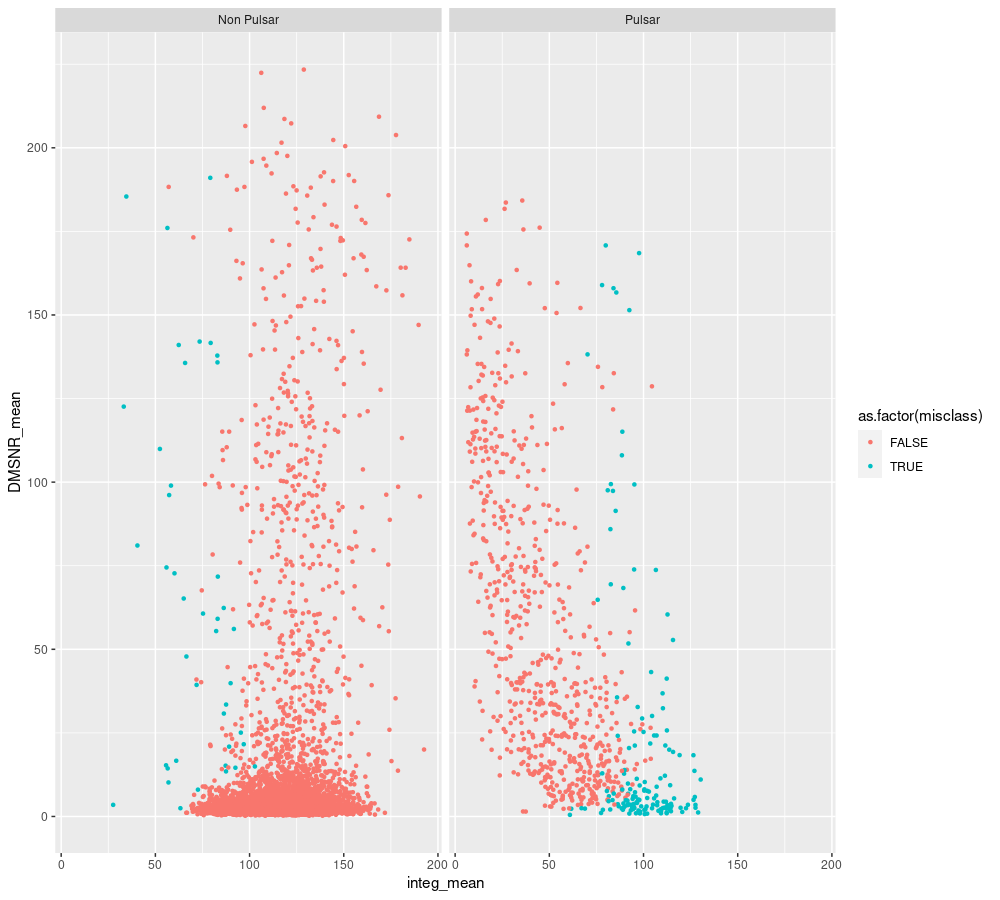

In [13]:
set.seed(100)
knn_pred1 <- predict(knn_fit1, newdata = pulsarTest)

knn_misclass <- sum(knn_pred1 != pulsarTest$Class)/nrow(pulsarTest)

sprintf("The knn misclassification rate is %0.3f" , knn_misclass)

pulsarTest2 <- pulsarTest %>% select(everything()) %>% mutate(knnPred = knn_pred1, misclass = knnPred != Class)
head(pulsarTest2)

pulsarTest2 %>% ggplot(aes(x = integ_mean, y = DMSNR_mean, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class)

knitr::kable(table(knn_pred1, pulsarTest$Class))

In [14]:
tune_grid <- expand.grid(mtry = c(1,2))

ntree_opt <- expand.grid(ntree = c(500, 1000))

tune_grid

ntree_opt

mtry
<dbl>
1
2


ntree
<dbl>
500
1000


In [15]:
rf_fit <- train(Class ~ ., 
                data = pulsarTrain, 
                method = 'rf',
                preProcess = c('center', 'scale'), 
                importance = TRUE,
                tuneGrid = tune_grid,
                ntree = 1000)
rf_fit

Random Forest 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

Pre-processing: centered (8), scaled (8) 
Resampling: Bootstrapped (25 reps) 
Summary of sample sizes: 8949, 8949, 8949, 8949, 8949, 8949, ... 
Resampling results across tuning parameters:

  mtry  Accuracy   Kappa    
  1     0.9777568  0.8576064
  2     0.9785704  0.8639180

Accuracy was used to select the optimal model using the largest value.
The final value used for the model was mtry = 2.

[1] "The rf misclassification rate is 0.020"

integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew,Class,knnPred,misclass
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<lgl>
140.56250,55.68378,-0.2345714,-0.6996484,3.199833,19.11043,7.975532,74.24222,Non Pulsar,Non Pulsar,FALSE
102.50781,58.88243,0.4653182,-0.5150879,1.677258,14.86015,10.576487,127.39358,Non Pulsar,Non Pulsar,FALSE
88.72656,40.67223,0.6008661,1.1234917,1.178930,11.46872,14.269573,252.56731,Non Pulsar,Non Pulsar,FALSE
93.57031,46.69811,0.5319048,0.4167211,1.636288,14.54507,10.621748,131.39400,Non Pulsar,Non Pulsar,FALSE
107.25781,39.49649,0.4658820,1.1628771,4.079431,24.98042,7.397080,57.78474,Non Pulsar,Non Pulsar,FALSE
142.07812,45.28807,-0.3203284,0.2839525,5.376254,29.00990,6.076266,37.83139,Non Pulsar,Non Pulsar,FALSE




|           | Non Pulsar| Pulsar|
|:----------|----------:|------:|
|Non Pulsar |       8057|    121|
|Pulsar     |         55|    716|

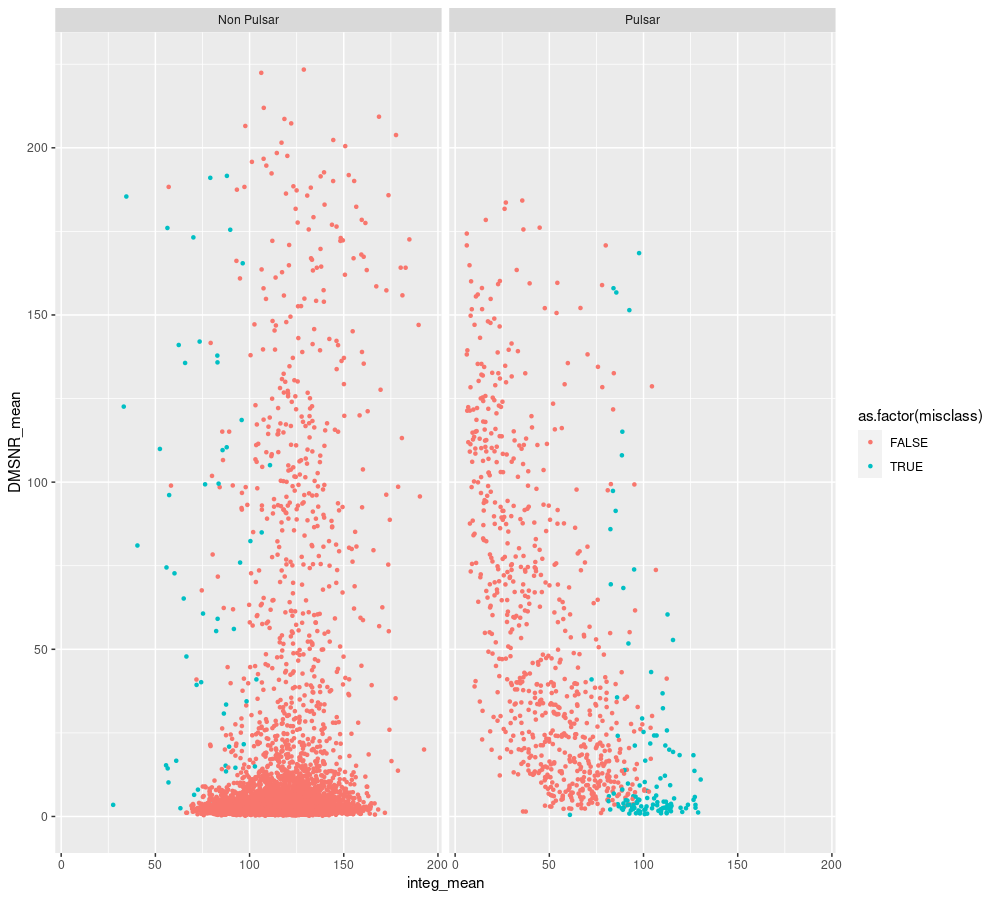

In [16]:
set.seed(100)
rf_pred <- predict(rf_fit, newdata = pulsarTest)

rf_misclass <- sum(rf_pred != pulsarTest$Class)/nrow(pulsarTest)

sprintf("The rf misclassification rate is %0.3f" , rf_misclass)

pulsarTest3 <- pulsarTest %>% select(everything()) %>% mutate(rfPred = rf_pred, misclass = rfPred != Class)
head(pulsarTest2)

pulsarTest3 %>% ggplot(aes(x = integ_mean, y = DMSNR_mean, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class)

knitr::kable(table(rf_pred, pulsarTest$Class))

In [17]:
log_fit <- train(Class ~ ., 
                 method = "glm", 
                 family = "binomial", 
                 data = pulsarTrain, 
                 trControl = trctrl)
log_fit

Generalized Linear Model 

8949 samples
   8 predictor
   2 classes: 'Non Pulsar', 'Pulsar' 

No pre-processing
Resampling: Cross-Validated (5 fold, repeated 2 times) 
Summary of sample sizes: 7158, 7160, 7158, 7160, 7160, 7158, ... 
Resampling results:

  Accuracy   Kappa    
  0.9786568  0.8610915


In [18]:
summary(log_fit)


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-4.2964  -0.1665  -0.0993  -0.0558   3.7270  

Coefficients:
              Estimate Std. Error z value Pr(>|z|)    
(Intercept) -10.095283   1.407801  -7.171 7.45e-13 ***
integ_mean    0.028355   0.008415   3.369 0.000753 ***
integ_sd     -0.028674   0.014495  -1.978 0.047901 *  
integ_exkur   6.522688   0.423035  15.419  < 2e-16 ***
integ_skew   -0.626403   0.051326 -12.204  < 2e-16 ***
DMSNR_mean   -0.022262   0.004688  -4.749 2.05e-06 ***
DMSNR_sd      0.061985   0.010556   5.872 4.30e-09 ***
DMSNR_exkur   0.210063   0.142723   1.472 0.141069    
DMSNR_skew   -0.011123   0.005665  -1.963 0.049595 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 5399.0  on 8948  degrees of freedom
Residual deviance: 1326.1  on 8940  degrees of freedom
AIC: 1344.1

Number of Fisher Scoring iterations: 8


In [19]:
summary(rf_fit)

                Length Class      Mode     
call                6  -none-     call     
type                1  -none-     character
predicted        8949  factor     numeric  
err.rate         3000  -none-     numeric  
confusion           6  -none-     numeric  
votes           17898  matrix     numeric  
oob.times        8949  -none-     numeric  
classes             2  -none-     character
importance         32  -none-     numeric  
importanceSD       24  -none-     numeric  
localImportance     0  -none-     NULL     
proximity           0  -none-     NULL     
ntree               1  -none-     numeric  
mtry                1  -none-     numeric  
forest             14  -none-     list     
y                8949  factor     numeric  
test                0  -none-     NULL     
inbag               0  -none-     NULL     
xNames              8  -none-     character
problemType         1  -none-     character
tuneValue           1  data.frame list     
obsLevels           2  -none-   

In [20]:
names(rf_fit)

[1] "method"       "modelInfo"    "modelType"    "results"      "pred"        
 [6] "bestTune"     "call"         "dots"         "metric"       "control"     
[11] "finalModel"   "preProcess"   "trainingData" "resample"     "resampledCM" 
[16] "perfNames"    "maximize"     "yLimits"      "times"        "levels"      
[21] "terms"        "coefnames"    "xlevels"

In [21]:
rf_fit$finalModel


Call:
 randomForest(x = x, y = y, ntree = 1000, mtry = min(param$mtry,      ncol(x)), importance = TRUE) 
               Type of random forest: classification
                     Number of trees: 1000
No. of variables tried at each split: 2

        OOB estimate of  error rate: 2.01%
Confusion matrix:
           Non Pulsar Pulsar class.error
Non Pulsar       8096     51 0.006259973
Pulsar            129    673 0.160847880

In [22]:
rf_fit$results

,mtry,Accuracy,Kappa,AccuracySD,KappaSD
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0.9777568,0.8576064,0.002453829,0.01395062
2,2,0.9785704,0.8639180,0.002201331,0.01268890


randomForest 4.6-14

Type rfNews() to see new features/changes/bug fixes.


Attaching package: ‘randomForest’


The following object is masked from ‘package:dplyr’:

    combine


The following object is masked from ‘package:ggplot2’:

    margin




[1] "method"       "modelInfo"    "modelType"    "results"      "pred"        
 [6] "bestTune"     "call"         "dots"         "metric"       "control"     
[11] "finalModel"   "preProcess"   "trainingData" "resample"     "resampledCM" 
[16] "perfNames"    "maximize"     "yLimits"      "times"        "levels"      
[21] "terms"        "coefnames"    "xlevels"

,Non Pulsar,Pulsar,name
,<dbl>,<dbl>,<named list>
DMSNR_skew,0.000000,0.000000,integ_mean
DMSNR_exkur,4.696528,4.696528,integ_sd
DMSNR_mean,14.102056,14.102056,integ_exkur
integ_sd,17.645510,17.645510,integ_skew
DMSNR_sd,19.398997,19.398997,DMSNR_mean
integ_mean,20.651496,20.651496,DMSNR_sd
integ_skew,29.694914,29.694914,DMSNR_exkur
integ_exkur,100.000000,100.000000,DMSNR_skew


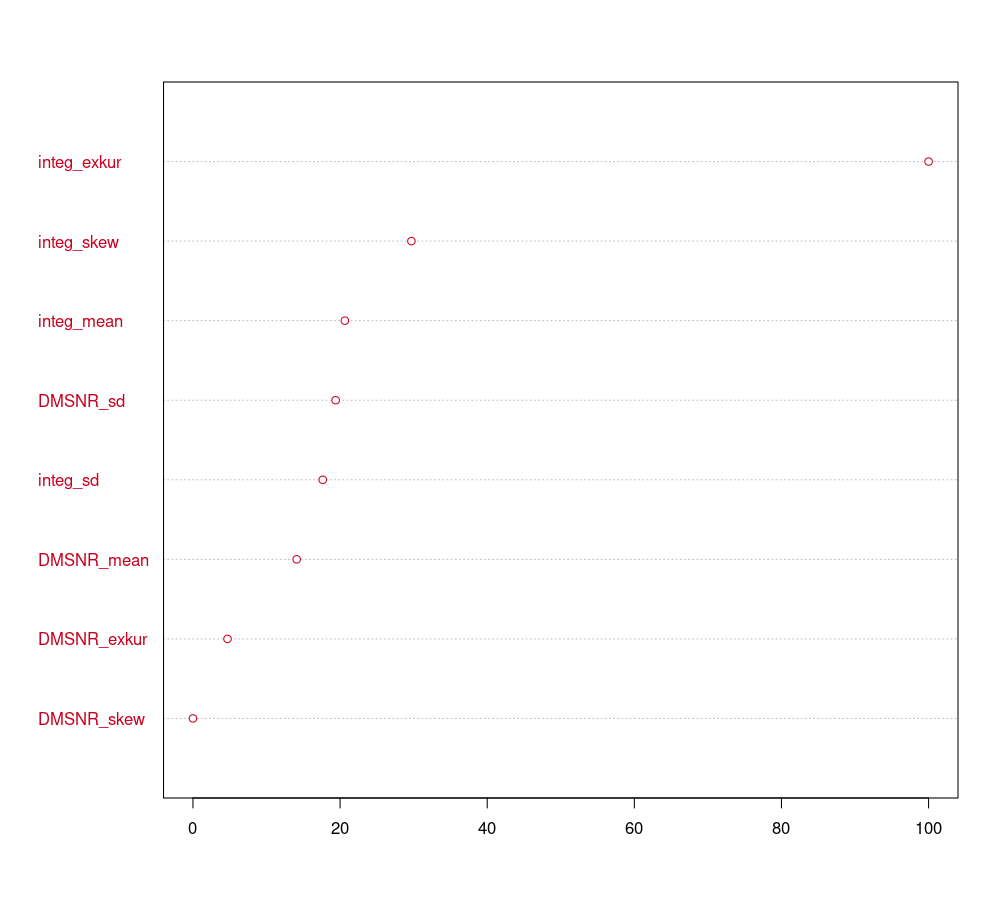

In [23]:
library(randomForest)

var_imp <- varImp(rf_fit, scale = TRUE)

var_imp <- as.data.frame(var_imp$importance)

var_imp <- var_imp[order(var_imp[[1]]), ]

var_imp$name <- short_names[1:8]

#as.data.frame(varImp(rf_fit, scale = TRUE)$importance)[order(varImp(rf_fit, scale = TRUE)[[1]]), ]


#print(var_imp)

dotchart(var_imp[[1]] , labels = row.names(var_imp), col = dense_colors[5])

names(rf_fit)
var_imp
#print(rf_fit$modelInfo)

In [24]:
PCA_pulsar <- prcomp(select(df_pulsar, integ_mean:DMSNR_skew) , scale = TRUE)

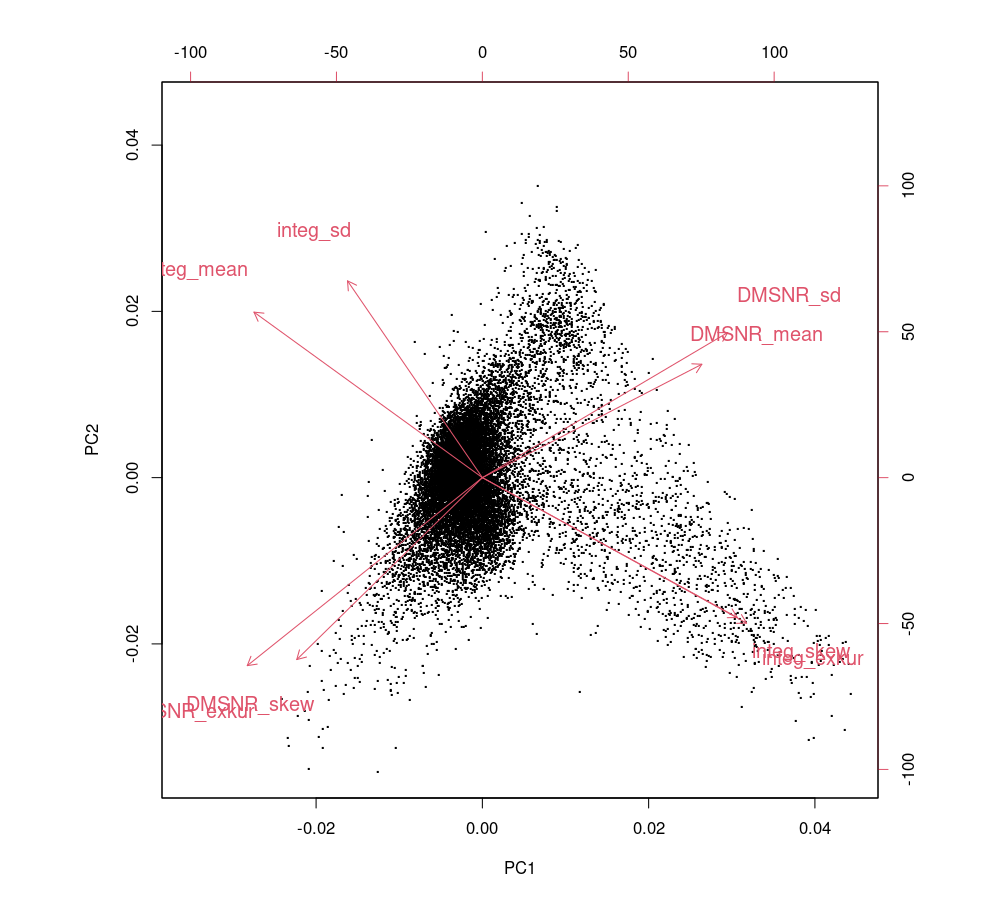

In [25]:
biplot(PCA_pulsar, xlabs = rep(".", nrow(df_pulsar)), cex = 1.2)

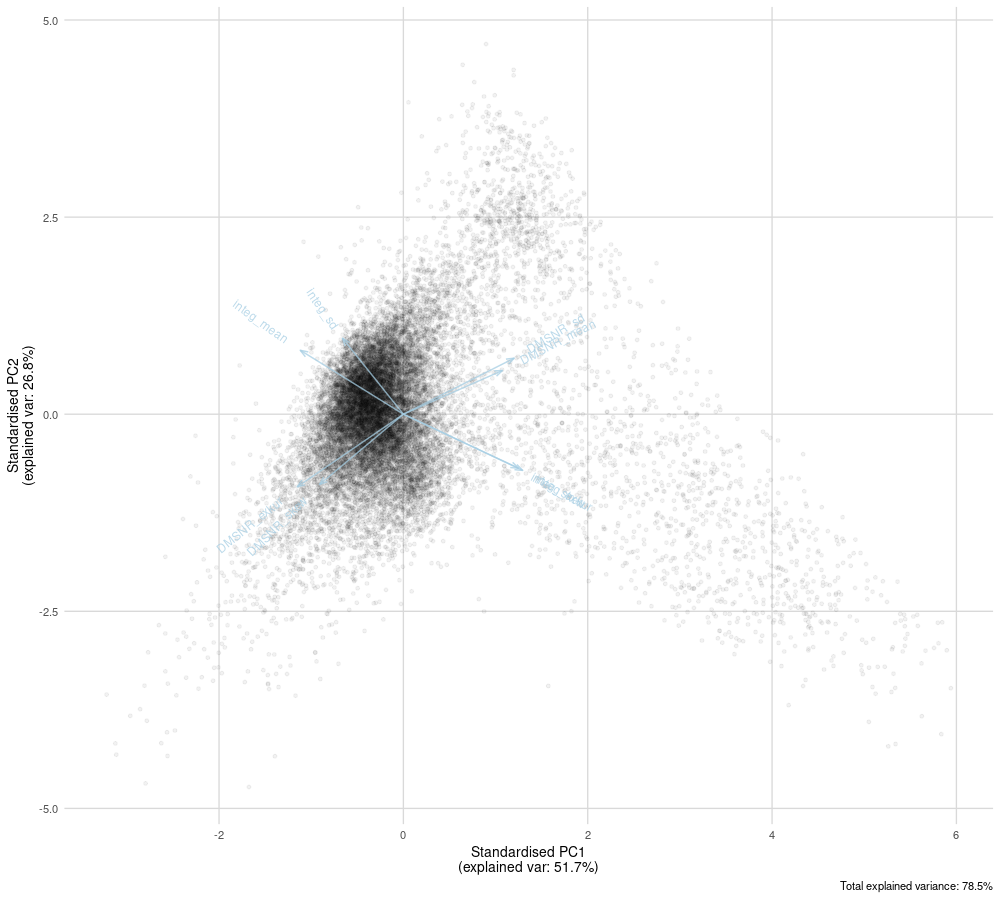

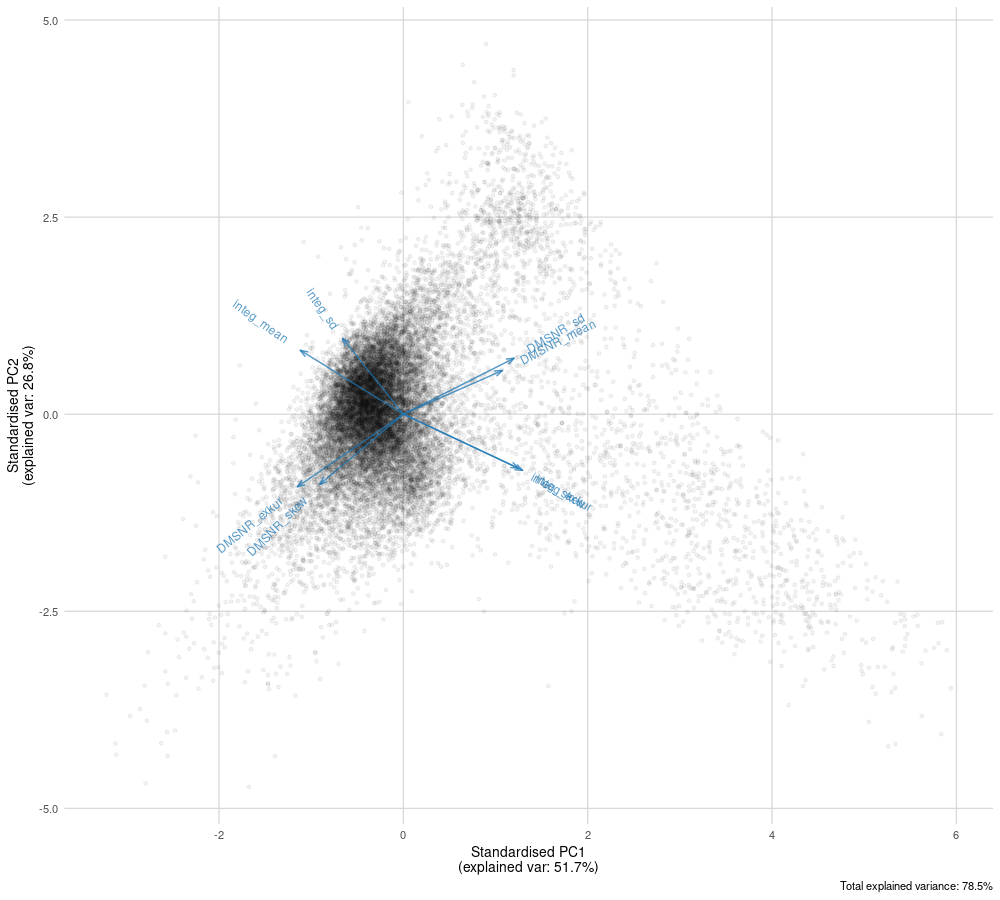

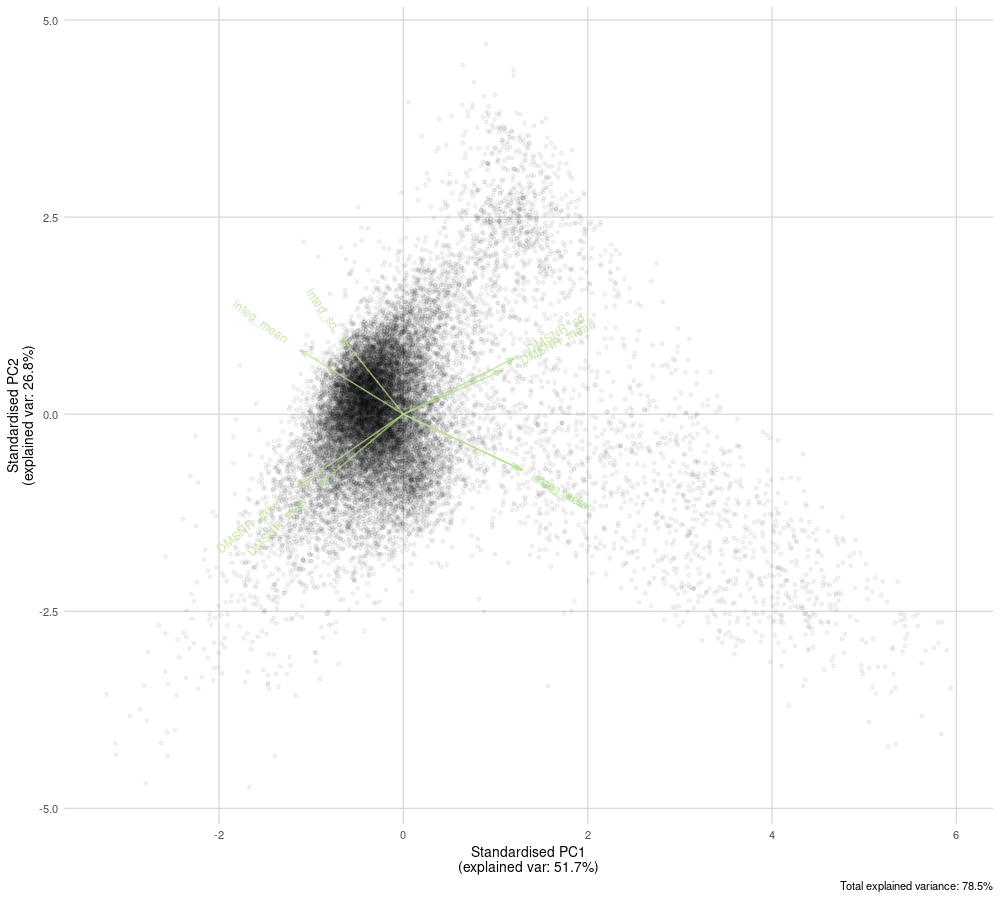

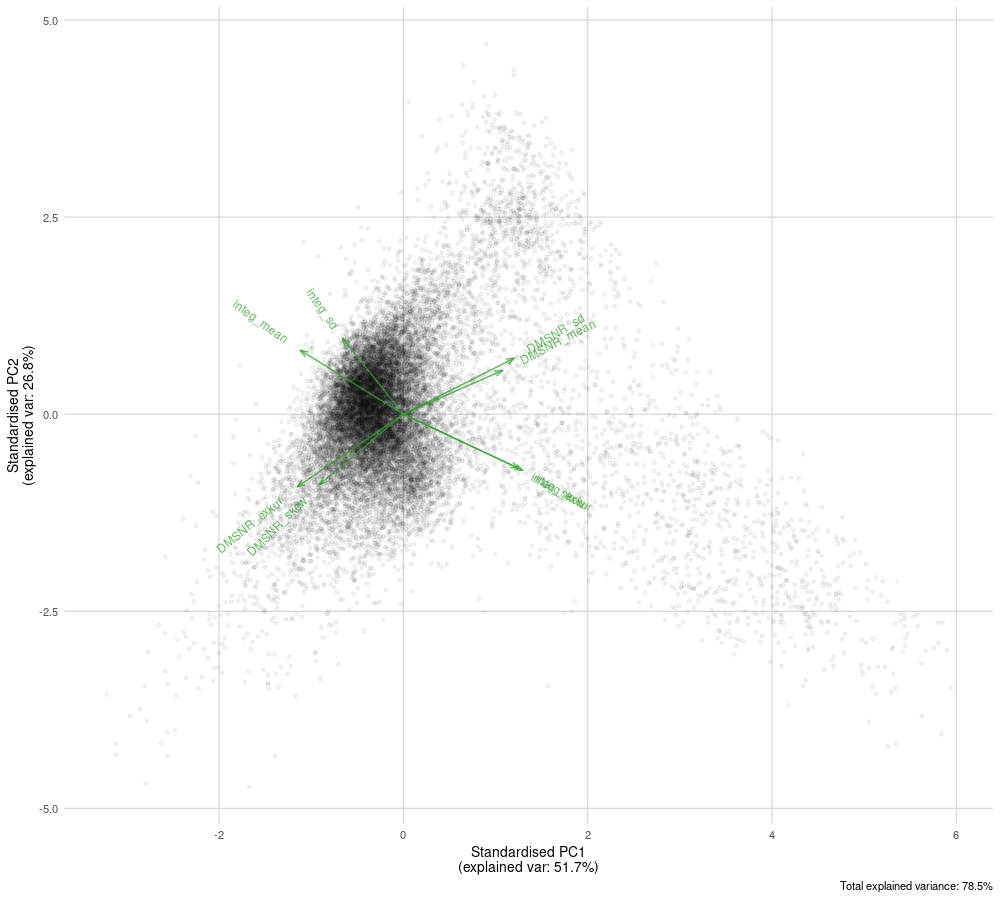

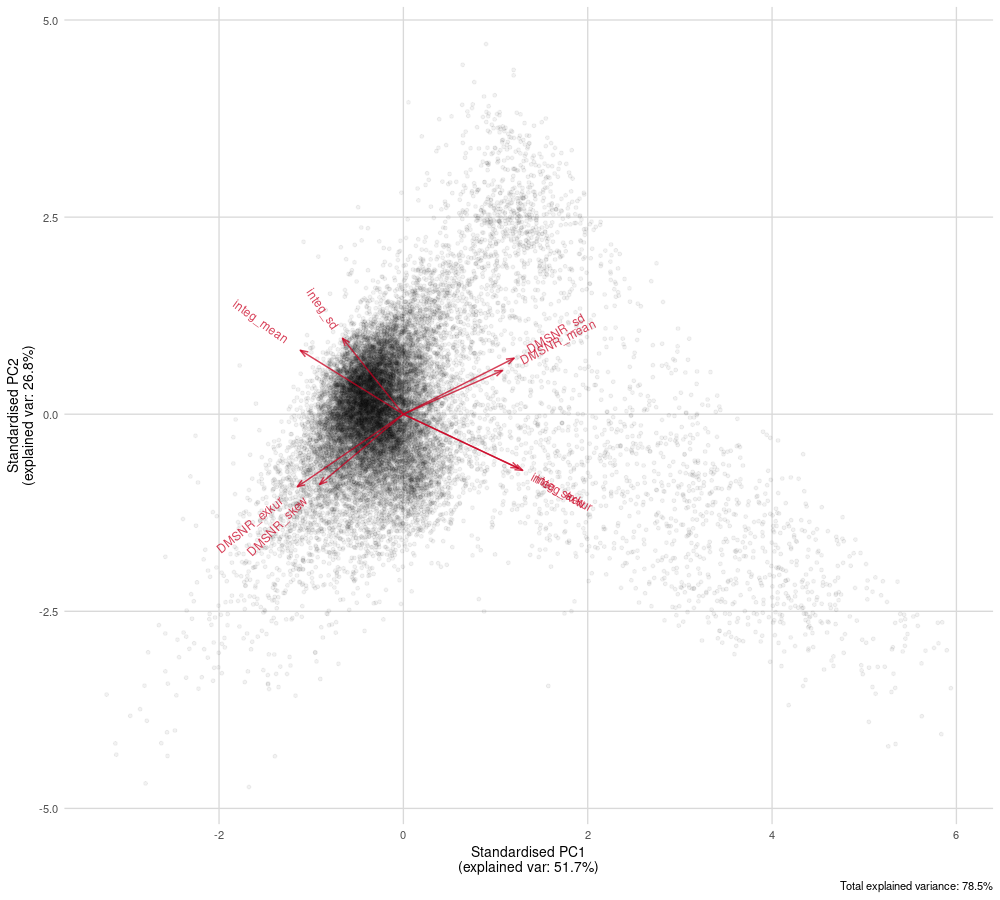

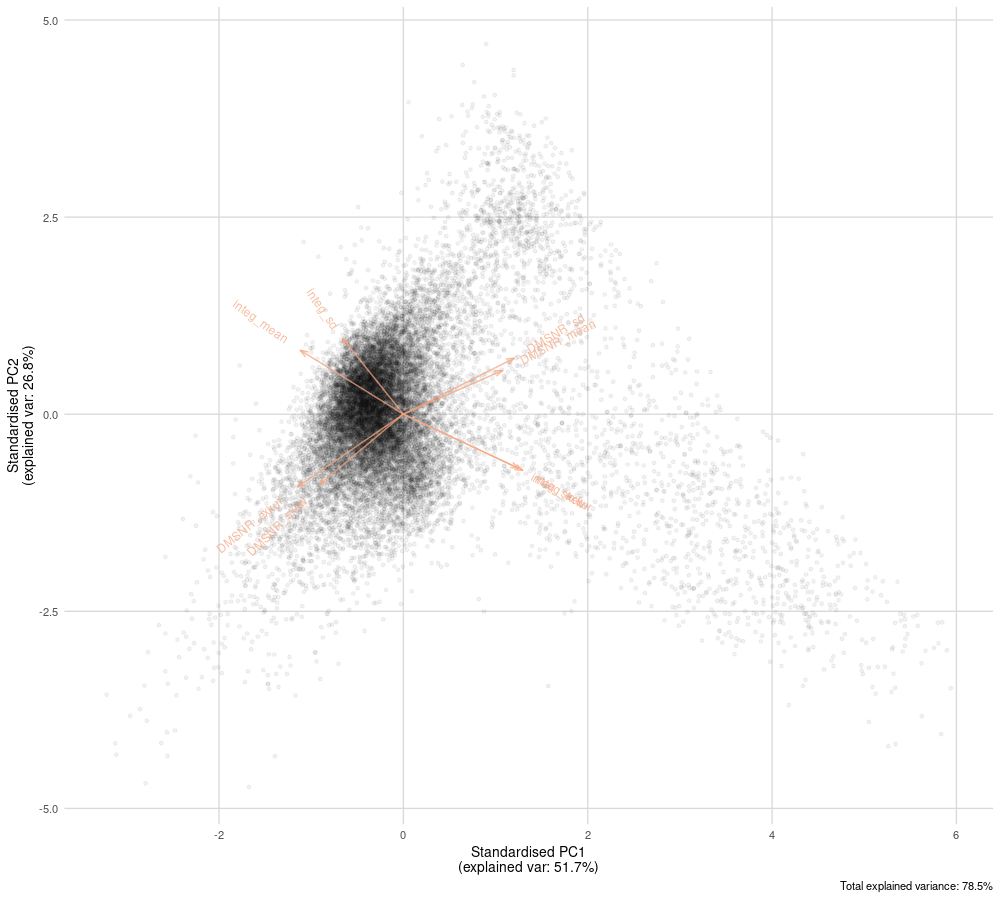

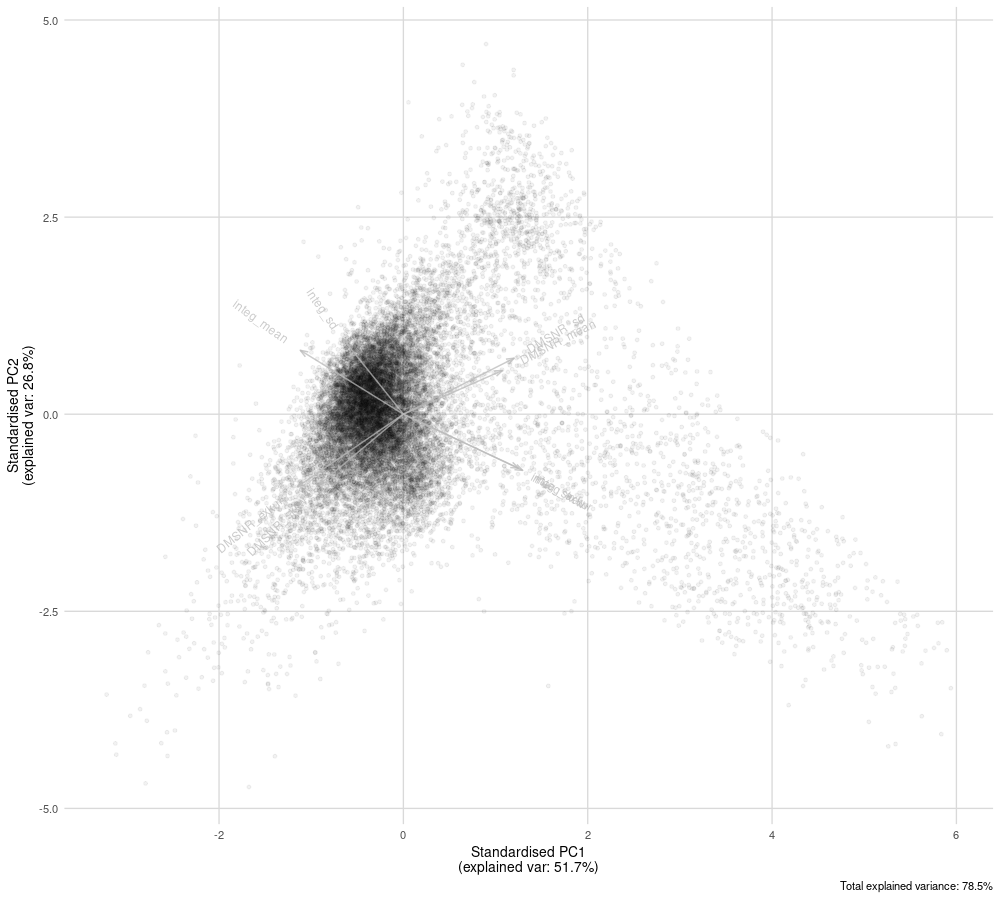

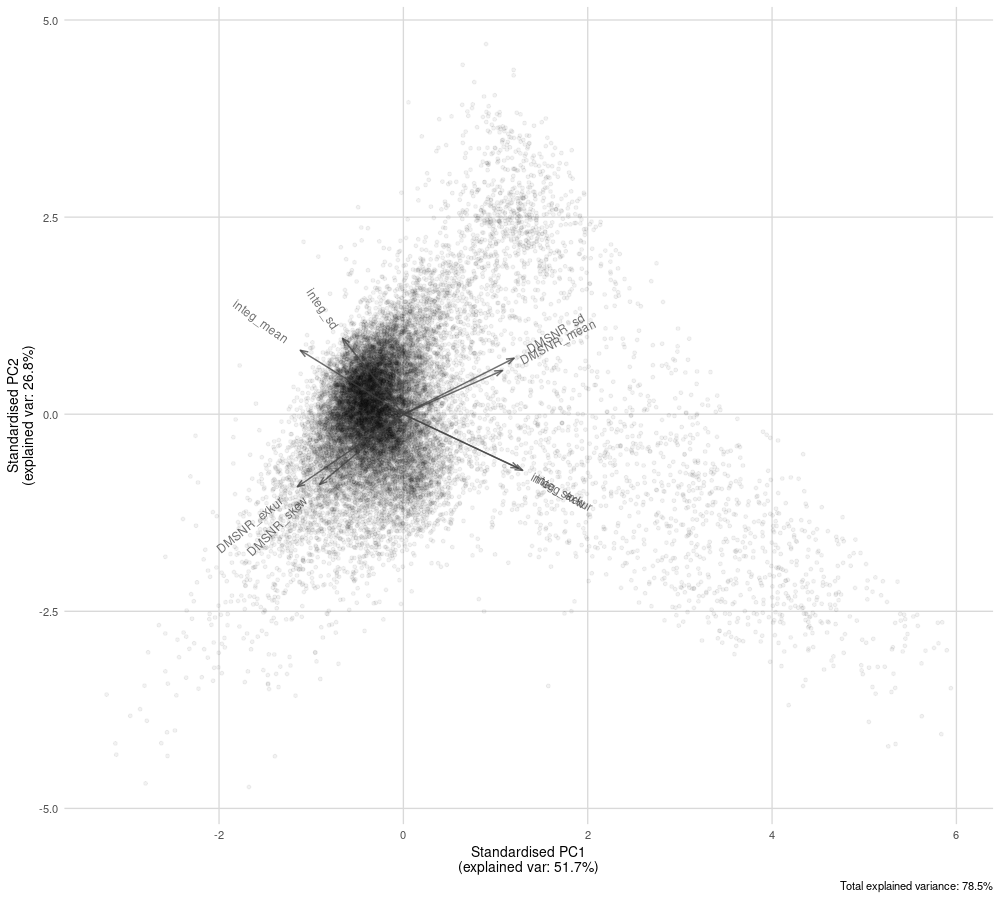

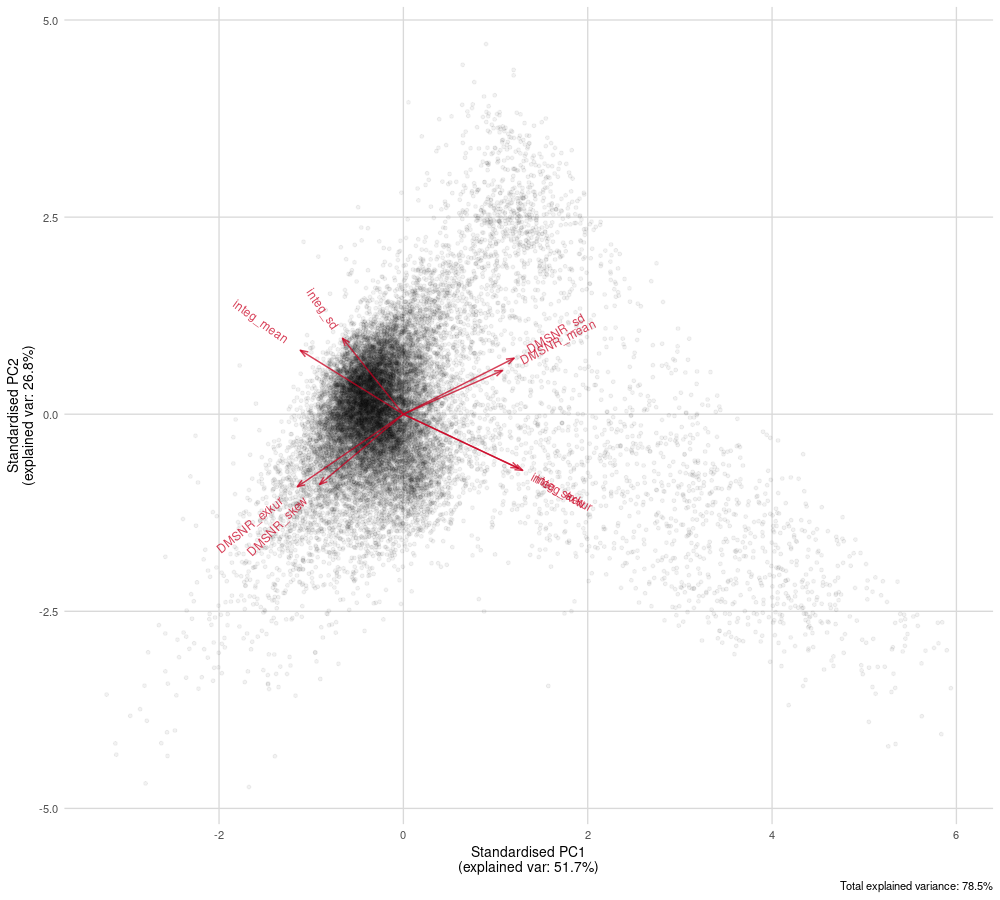

In [26]:
library(AMR)

#c('#a6cee3','#1f78b4','#b2df8a','#33a02c', '#ca0020','#f4a582','#bababa','#404040')

for(i in dense_colors){
    print(ggplot_pca(PCA_pulsar, points_size = 1,
                     points_alpha = 0.05,
                     arrows = TRUE,
                     arrows_colour = i,)
          )
}

ggplot_pca(PCA_pulsar, points_size = 1,
           points_alpha = 0.05,
           arrows = TRUE,
           arrows_colour = dense_colors[5],)

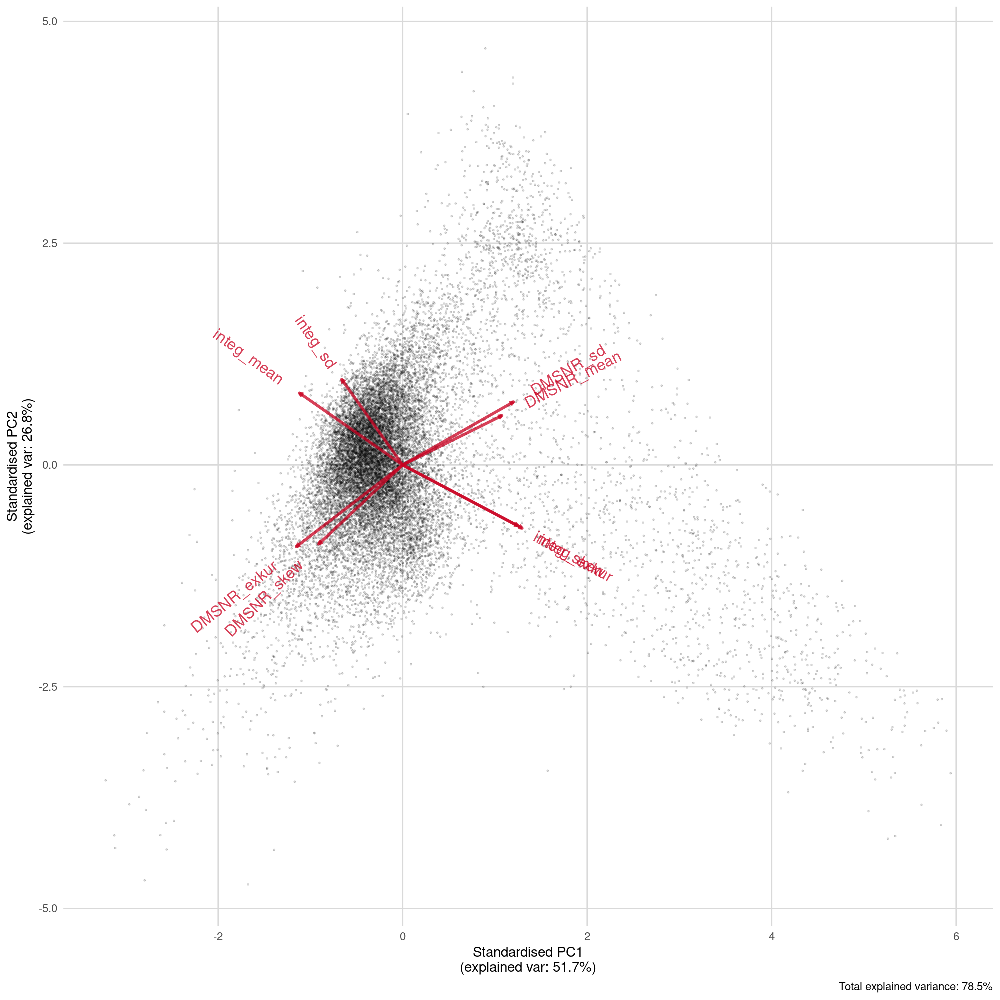

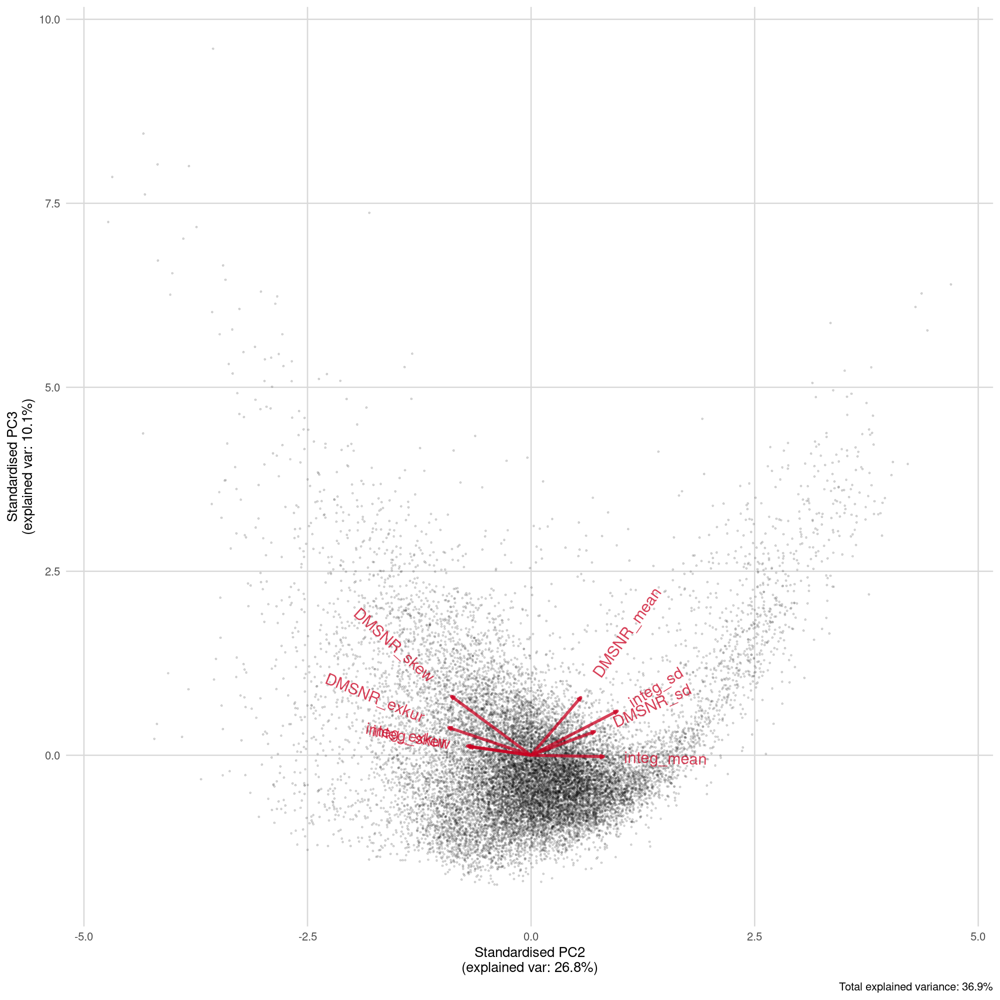

In [27]:
options(repr.plot.width = 20, repr.plot.height = 20, repr.plot.res = 100)

ggplot_pca(PCA_pulsar, 
           choices = 1:2, 
           points_size = 1,
           points_alpha = 0.15,
           arrows = TRUE,
           arrows_colour = dense_colors[5],
           arrows_size = 2,
           arrows_textsize = 8,
           arrows_textangled = TRUE,
           arrows_alpha = 0.75,
           base_textsize = 20)

ggplot_pca(PCA_pulsar, 
           choices = c(2.0,3.0), 
           points_size = 1,
           points_alpha = 0.15,
           arrows = TRUE,
           arrows_colour = dense_colors[5],
           arrows_size = 2,
           arrows_textsize = 8,
           arrows_textangled = TRUE,
           arrows_alpha = 0.75,
           base_textsize = 20)

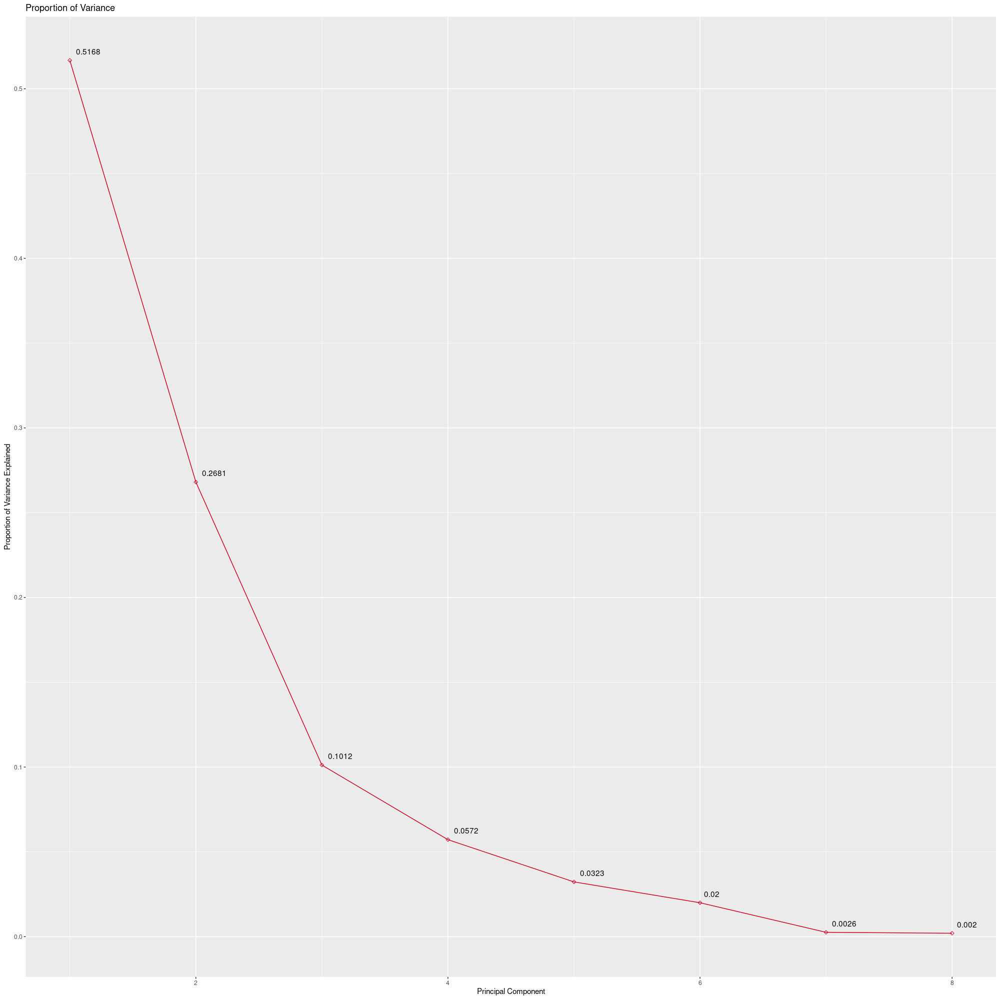

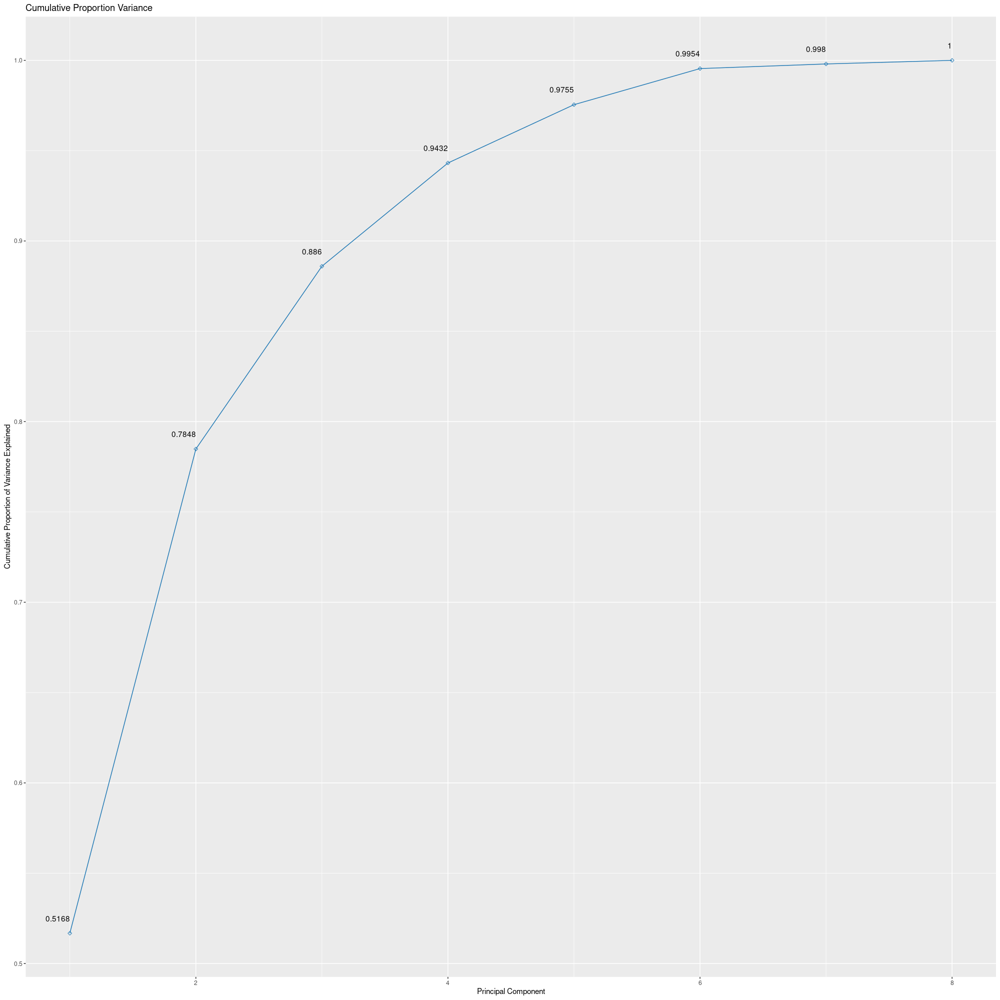

In [31]:
df_pca_plot <- as_tibble(cbind(1:8, PCA_pulsar$sdev^2), .name_repair = "minimal")

colnames(df_pca_plot) <- c("PCA", "variance")

#df_pca_plot %>% print()

df_pca_plot %>% ggplot(aes(x = PCA, y = variance/sum(variance))) + geom_point(shape = 5, col = dense_colors[5]) + 
                                                                   geom_line(col = dense_colors[5]) + labs(x = "Principal Component", 
                                                                                      y = "Proportion of Variance Explained",
                                                                                      title = "Proportion of Variance") +
                                                                   geom_text(aes(x = PCA, 
                                                                                 y = variance/sum(variance), 
                                                                                 label = round(variance/sum(variance), 4),
                                                                                 hjust = -0.25,
                                                                                 vjust = -1))

df_pca_plot %>% ggplot(aes(x = PCA, y = cumsum(variance/sum(variance)))) + geom_point(shape = 5, col = dense_colors[2]) + 
                                                                           geom_line(col = dense_colors[2]) + labs(x = "Principal Component", 
                                                                                              y = "Cumulative Proportion of Variance Explained",
                                                                                              title = "Cumulative Proportion Variance") +
                                                                           geom_text(aes(x = PCA, 
                                                                                         y = cumsum(variance/sum(variance)), 
                                                                                         label = round(cumsum(variance/sum(variance)), 4),
                                                                                         hjust = 1,
                                                                                         vjust = -2))

In [32]:
names(PCA_pulsar)

[1] "sdev"     "rotation" "center"   "scale"    "x"

In [33]:
PCA_pulsar$sdev
PCA_pulsar$rotation
PCA_tab <- data.frame(cbind(PCA_pulsar$rotation, "Means" = PCA_pulsar$center, "Standard Deviation" = PCA_pulsar$sdev), row.names = proper_names)

print(round(PCA_tab,3))

[1] 2.0332355 1.4644470 0.8996382 0.6763319 0.5081603 0.3998491 0.1429753
[8] 0.1265948

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
integ_mean,-0.3596622,0.3618849,-0.01325276,-0.29225602,0.74434976,-0.01841197,-0.31459003,-0.027033145
integ_sd,-0.2123480,0.4302135,0.43643440,0.75678826,0.01895864,-0.04607132,0.06416928,-0.004641837
integ_exkur,0.4161365,-0.3181397,0.09173293,0.30304693,0.14615196,-0.05228488,-0.77303907,-0.060676591
integ_skew,0.4014866,-0.3057701,0.08346561,0.17789768,0.64361070,0.02074329,0.53965092,0.028477027
DMSNR_mean,0.3456256,0.2479177,0.57038435,-0.33242329,-0.07333901,0.60719734,-0.02631342,-0.092068394
DMSNR_sd,0.3863212,0.3172270,0.23420002,-0.25773213,-0.06594445,-0.75165549,0.06107319,-0.236184030
DMSNR_exkur,-0.3702155,-0.4110223,0.27334335,-0.03798298,0.00344466,-0.01531573,0.05065127,-0.784238385
DMSNR_skew,-0.2922836,-0.3977587,0.58229150,-0.19999783,-0.01580270,-0.24589691,-0.03339184,0.561663372


                                 PC1    PC2    PC3    PC4    PC5    PC6    PC7
Integrated Mean               -0.360  0.362 -0.013 -0.292  0.744 -0.018 -0.315
Integrated Standard Deviation -0.212  0.430  0.436  0.757  0.019 -0.046  0.064
Integrated Kurtosis            0.416 -0.318  0.092  0.303  0.146 -0.052 -0.773
Intergrated Skew               0.401 -0.306  0.083  0.178  0.644  0.021  0.540
DMSNR Mean                     0.346  0.248  0.570 -0.332 -0.073  0.607 -0.026
DMSNR Standard Deviation       0.386  0.317  0.234 -0.258 -0.066 -0.752  0.061
DMSNR Kurtosis                -0.370 -0.411  0.273 -0.038  0.003 -0.015  0.051
DMSNR Skew                    -0.292 -0.398  0.582 -0.200 -0.016 -0.246 -0.033
                                 PC8   Means Standard.Deviation
Integrated Mean               -0.027 111.080              2.033
Integrated Standard Deviation -0.005  46.550              1.464
Integrated Kurtosis           -0.061   0.478              0.900
Intergrated Skew               0.

# A tibble: 17,898 x 4
   integ_sd DMSNR_mean Class      cluster
      <dbl>      <dbl> <fct>        <int>
 1     55.7      3.20  Non Pulsar       2
 2     58.9      1.68  Non Pulsar       2
 3     39.3      3.12  Non Pulsar       1
 4     57.2      3.64  Non Pulsar       2
 5     40.7      1.18  Non Pulsar       1
 6     46.7      1.64  Non Pulsar       2
 7     48.8      0.999 Non Pulsar       2
 8     39.8      1.22  Non Pulsar       1
 9     52.6      2.33  Non Pulsar       2
10     39.5      4.08  Non Pulsar       1
# … with 17,888 more rows


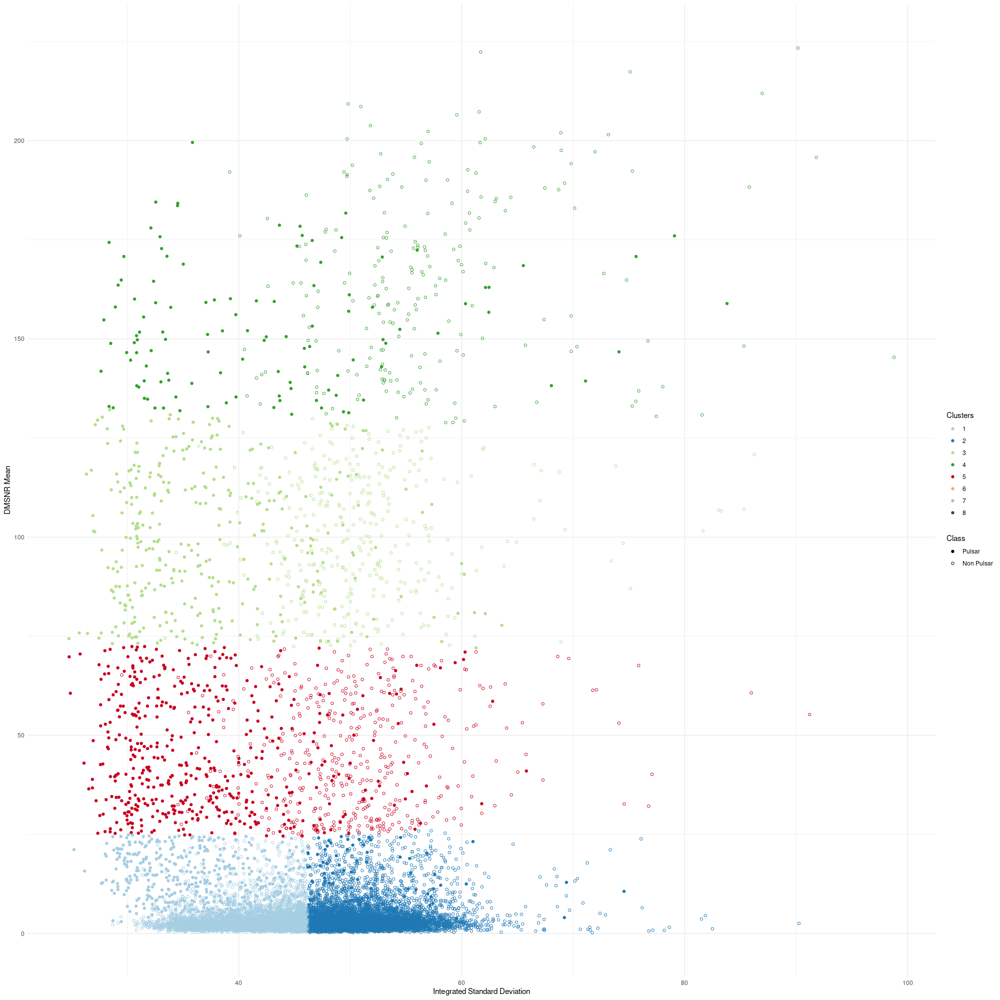

In [34]:
#Kmeans
set.seed(800)

plot_var <- c("integ_sd", "DMSNR_mean", "Class")

proper_names <- c("Integrated Mean", "Integrated Standard Deviation", 
                  "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                  "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

km_pulsar <- kmeans(df_pulsar[ , plot_var[1:2]], 5, nstart = 5)

#plot(df_pulsar[ , plot_var[1:2]], col = (km_pulsar$cluster + 1))

df_kplot <- as_tibble(cbind(df_pulsar[ , plot_var], km_pulsar$cluster))

names(df_kplot)[4] <- "cluster"

df_kplot %>% print()

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8]),
                                name = "Clusters") +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() +
             labs(x = proper_names[which(plot_var[1] == names(df_pulsar))], 
                  y = proper_names[which(plot_var[2] == names(df_pulsar))])

         x          y
1 41.32684   3.788429
2 51.08875   3.819495
3 44.38634  99.573849
4 51.82855 160.287963
5 43.33342  45.079938


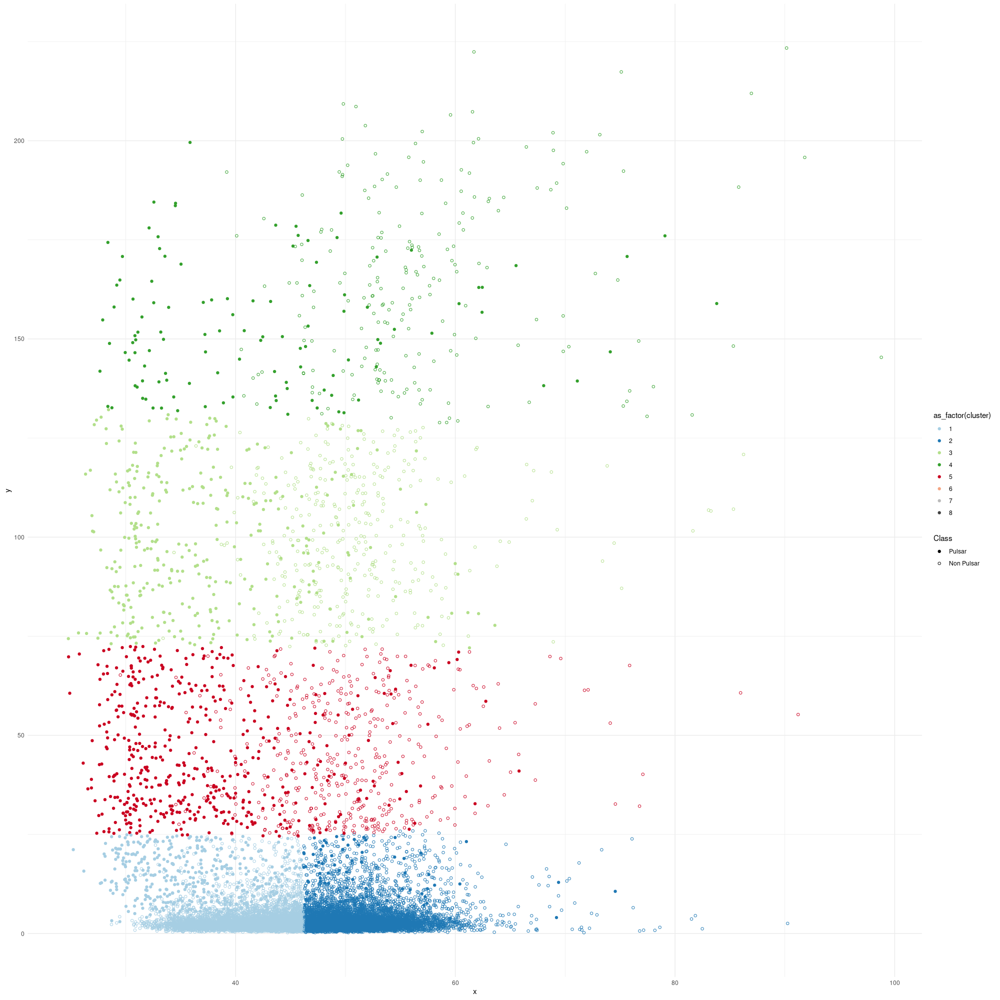

In [35]:
km_centers <- data.frame(km_pulsar$centers)

names(km_centers) = c("x", "y")

print(km_centers)

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8])) +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() #+
             #geom_point(data = km_centers, aes(x = x, y = y))

# A tibble: 17,898 x 4
   integ_mean integ_sd Class      cluster
        <dbl>    <dbl> <fct>        <int>
 1      141.      55.7 Non Pulsar       7
 2      103.      58.9 Non Pulsar       7
 3      103.      39.3 Non Pulsar       7
 4      137.      57.2 Non Pulsar       8
 5       88.7     40.7 Non Pulsar       4
 6       93.6     46.7 Non Pulsar       2
 7      119.      48.8 Non Pulsar       1
 8      130.      39.8 Non Pulsar       2
 9      107.      52.6 Non Pulsar       7
10      107.      39.5 Non Pulsar       8
# … with 17,888 more rows


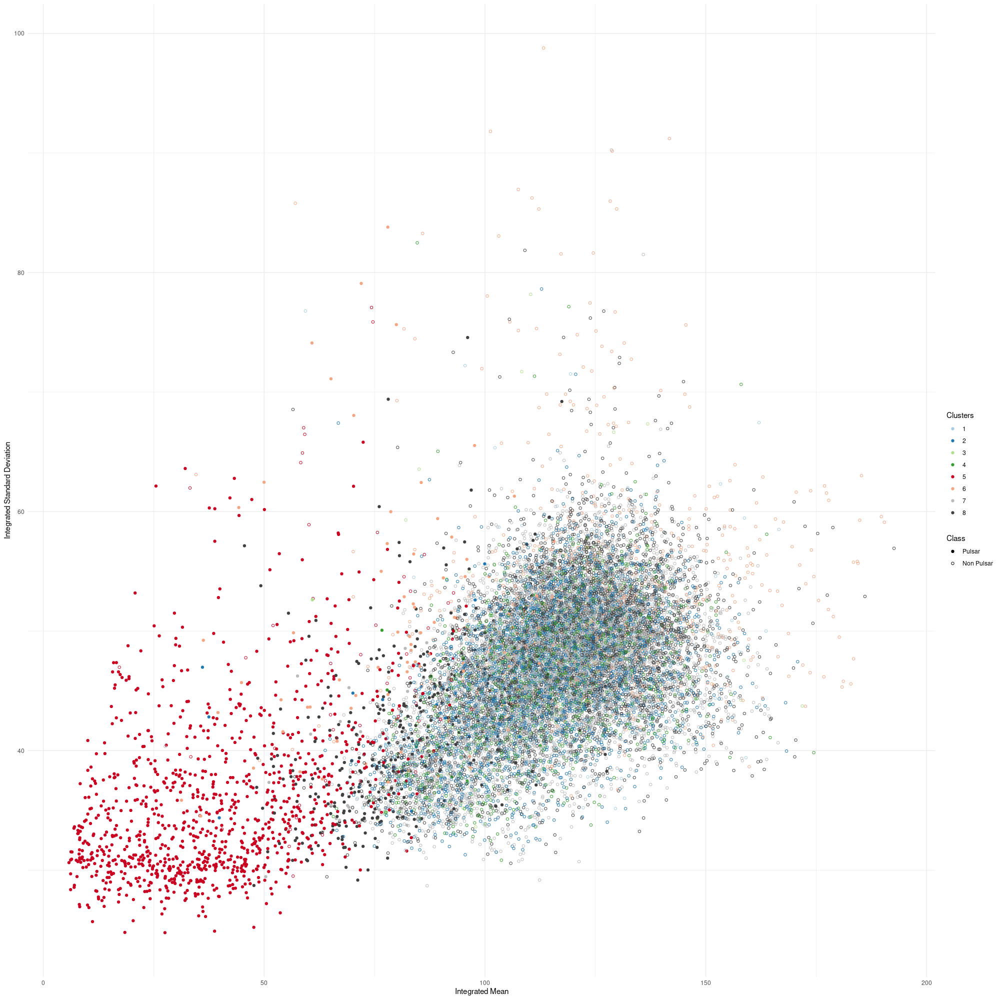

In [36]:
#Kmeans
set.seed(800)

options(repr.plot.width = 20, repr.plot.height = 20, repr.plot.res = 100)

plot_var <- c("integ_mean", "integ_sd", "Class")

proper_names <- c("Integrated Mean", "Integrated Standard Deviation", 
                  "Integrated Kurtosis", "Intergrated Skew", "DMSNR Mean", 
                  "DMSNR Standard Deviation", "DMSNR Kurtosis", "DMSNR Skew")

km_pulsar <- kmeans(df_pulsar[ ,1:8], 8, nstart = 5)

#plot(df_pulsar[ , plot_var[1:2]], col = (km_pulsar$cluster + 1))

df_kplot <- as_tibble(cbind(df_pulsar[ , plot_var], km_pulsar$cluster))

names(df_kplot)[4] <- "cluster"

df_kplot %>% print()

df_kplot %>% rename(x = plot_var[1], y = plot_var[2]) %>% 
             ggplot(aes(x = x, y = y, col = as_factor(cluster), shape = Class)) + 
             geom_point() + 
             scale_color_manual(values = list("1" = dense_colors[1], 
                                              "2" = dense_colors[2],
                                              "3" = dense_colors[3],
                                              "4" = dense_colors[4],
                                              "5" = dense_colors[5],
                                              "6" = dense_colors[6],
                                              "7" = dense_colors[7],
                                              "8" = dense_colors[8]),
                                name = "Clusters") +
             scale_shape_manual(values = list("Pulsar" = 19, 
                                              "Non Pulsar" = 1)) +
             theme_minimal() +
             labs(x = proper_names[which(plot_var[1] == names(df_pulsar))], 
                  y = proper_names[which(plot_var[2] == names(df_pulsar))])

In [37]:
km_pulsar <- kmeans(df_pulsar[ , 1:8], 5, nstart = 5)

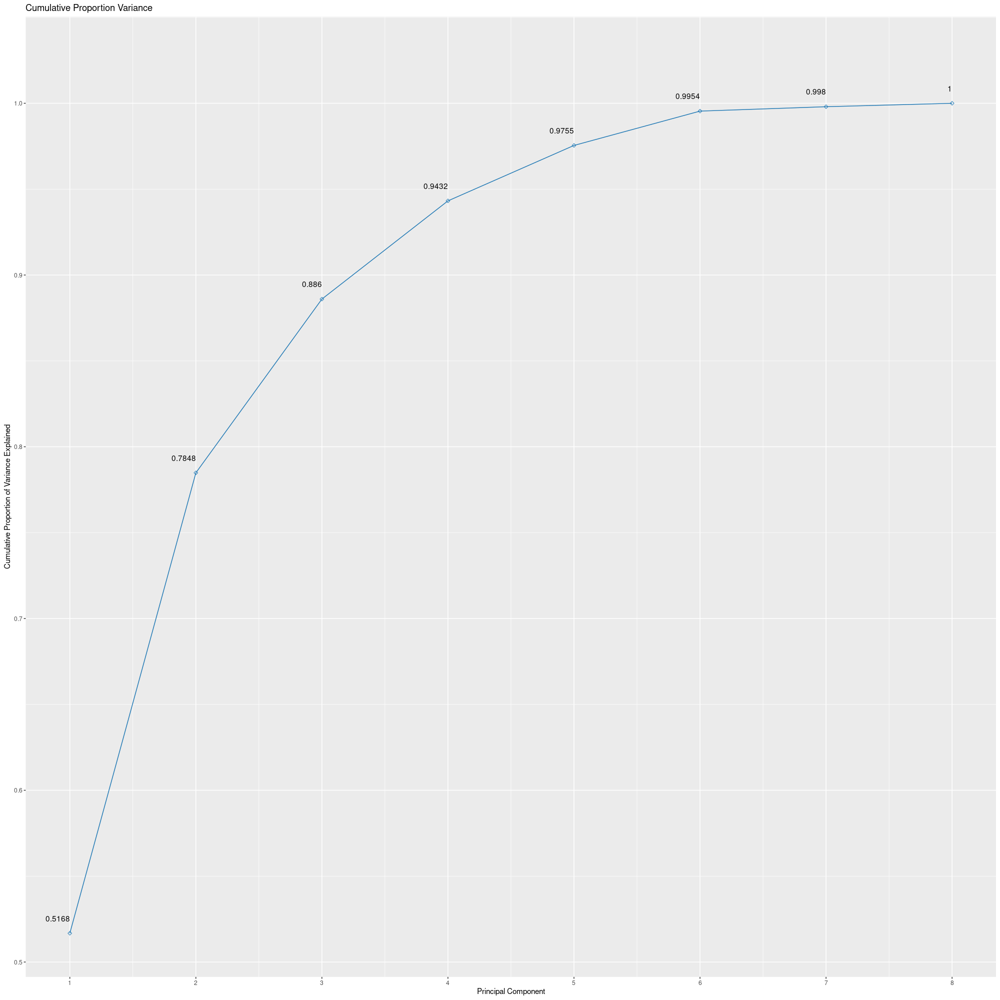

In [38]:
df_pca_plot %>% ggplot(aes(x = PCA, y = cumsum(variance/sum(variance)))) + geom_point(shape = 5, col = dense_colors[2]) + 
                                                                           geom_line(col = dense_colors[2]) + labs(x = "Principal Component", 
                                                                                              y = "Cumulative Proportion of Variance Explained",
                                                                                              title = "Cumulative Proportion Variance") +
                                                                           geom_text(aes(x = PCA, 
                                                                                         y = cumsum(variance/sum(variance)), 
                                                                                         label = round(cumsum(variance/sum(variance)), 4),
                                                                                         hjust = 1,
                                                                                         vjust = -2)) +
                                                                            ylim(NA, 1.025) + 
                                                                            scale_x_continuous(breaks = seq(0, 8, 1))

In [39]:
str(df_pulsar)

tibble [17,898 × 9] (S3: tbl_df/tbl/data.frame)
 $ integ_mean : num [1:17898] 140.6 102.5 103 136.8 88.7 ...
 $ integ_sd   : num [1:17898] 55.7 58.9 39.3 57.2 40.7 ...
 $ integ_exkur: num [1:17898] -0.2346 0.4653 0.3233 -0.0684 0.6009 ...
 $ integ_skew : num [1:17898] -0.7 -0.515 1.051 -0.636 1.123 ...
 $ DMSNR_mean : num [1:17898] 3.2 1.68 3.12 3.64 1.18 ...
 $ DMSNR_sd   : num [1:17898] 19.1 14.9 21.7 21 11.5 ...
 $ DMSNR_exkur: num [1:17898] 7.98 10.58 7.74 6.9 14.27 ...
 $ DMSNR_skew : num [1:17898] 74.2 127.4 63.2 53.6 252.6 ...
 $ Class      : Factor w/ 2 levels "Non Pulsar","Pulsar": 1 1 1 1 1 1 1 1 1 1 ...


In [40]:
model_sel <- c("glm", "knn", "tree")

"glm" %in% model_sel

[1] TRUE


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double(),
  X4 = col_double(),
  X5 = col_double(),
  X6 = col_double(),
  X7 = col_double(),
  X8 = col_double(),
  X9 = col_double()
)




[1] 1789

[1] 894

[1] 895

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”


Generalized Linear Model 

894 samples
  8 predictor
  2 classes: 'Non Pulsar', 'Pulsar' 

No pre-processing
Resampling: Cross-Validated (5 fold, repeated 2 times) 
Summary of sample sizes: 716, 715, 715, 715, 715, 716, ... 
Resampling results:

  Accuracy   Kappa    
  0.9776222  0.8686222



Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.7981  -0.1279  -0.0699  -0.0359   3.4346  

Coefficients:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept) -1.71301    5.04978  -0.339  0.73444    
integ_mean   0.04819    0.03193   1.509  0.13118    
integ_sd    -0.11031    0.06488  -1.700  0.08908 .  
integ_exkur  7.01173    1.59653   4.392 1.12e-05 ***
integ_skew  -0.66709    0.24947  -2.674  0.00750 ** 
DMSNR_mean  -0.03974    0.01507  -2.638  0.00834 ** 
DMSNR_sd    -0.00526    0.03894  -0.135  0.89255    
DMSNR_exkur -0.83661    0.47884  -1.747  0.08061 .  
DMSNR_skew   0.02047    0.01578   1.298  0.19437    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

(Dispersion parameter for binomial family taken to be 1)

    Null deviance: 575.07  on 893  degrees of freedom
Residual deviance: 101.23  on 885  degrees of freedom
AIC: 119.23

Number of Fisher Scoring iterations: 8


[1] "The log regression misclassification rate is 0.023"


integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew,Class,logPred,misclass
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<lgl>
119.76562,51.15395,0.15371984,-0.28419744,0.3511706,7.76400,30.077328,968.08375,Non Pulsar,Non Pulsar,FALSE
123.56250,54.91780,0.11887879,-0.45130080,2.4590301,21.21405,9.100760,84.40238,Non Pulsar,Non Pulsar,FALSE
97.10156,46.20586,0.48623769,0.37574696,0.4180602,8.61888,25.031765,682.51918,Non Pulsar,Non Pulsar,FALSE
108.12500,46.40582,0.42883731,0.23480018,2.0158863,16.99657,9.779745,105.90087,Non Pulsar,Non Pulsar,FALSE
137.42969,56.75574,-0.07093102,-0.59005239,3.6647157,22.39503,6.984094,53.58031,Non Pulsar,Non Pulsar,FALSE
108.27344,49.75781,0.15339132,-0.02486533,2.1454850,14.17062,10.213214,130.88367,Non Pulsar,Non Pulsar,FALSE


Confusion Matrix and Statistics

            Reference
Prediction   Non Pulsar Pulsar
  Non Pulsar        797     16
  Pulsar              5     77
                                          
               Accuracy : 0.9765          
                 95% CI : (0.9644, 0.9854)
    No Information Rate : 0.8961          
    P-Value [Acc > NIR] : <2e-16          
                                          
                  Kappa : 0.8671          
                                          
 Mcnemar's Test P-Value : 0.0291          
                                          
            Sensitivity : 0.9938          
            Specificity : 0.8280          
         Pos Pred Value : 0.9803          
         Neg Pred Value : 0.9390          
             Prevalence : 0.8961          
         Detection Rate : 0.8905          
   Detection Prevalence : 0.9084          
      Balanced Accuracy : 0.9109          
                                          
       'Positive' Class : Non Pulsa

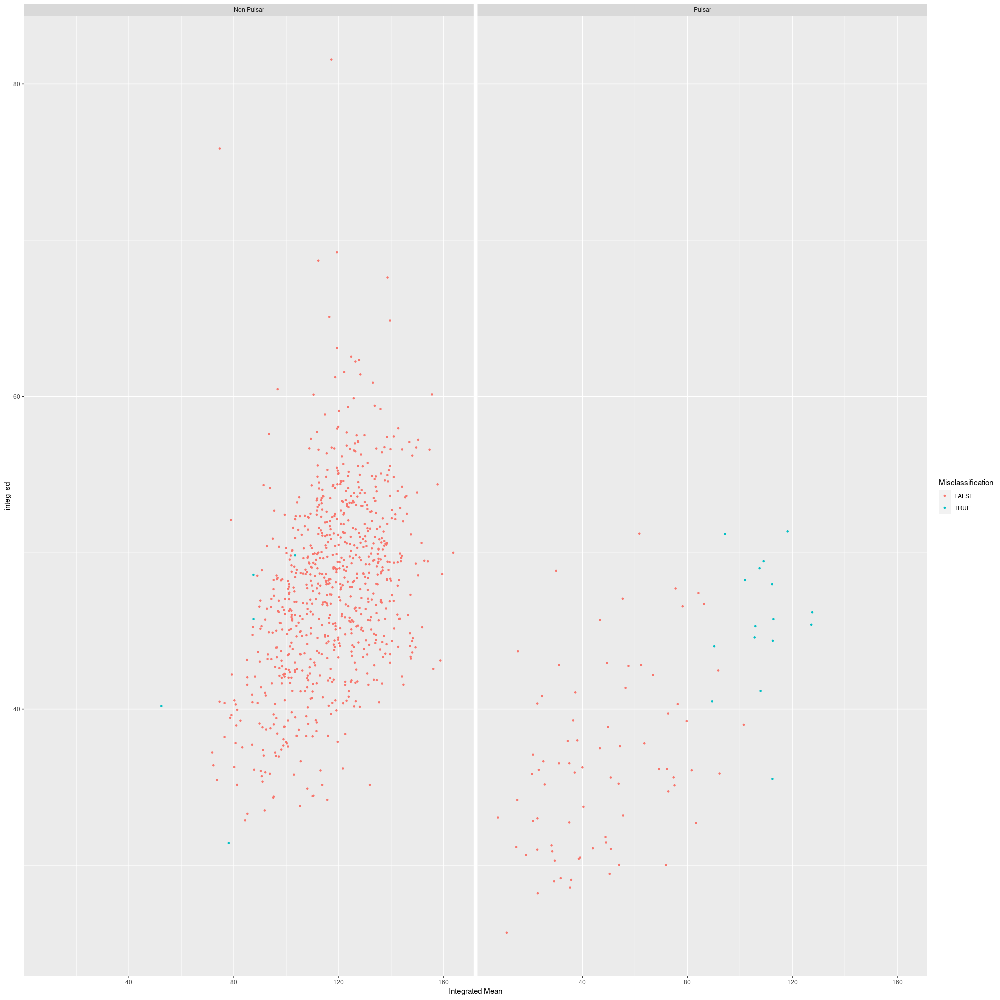

In [42]:
df_pulsar <- read_csv("HTRU_2.csv", col_names = FALSE)

names(df_pulsar) <- c("integ_mean","integ_sd","integ_exkur","integ_skew",
                      "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

df_pulsar <- df_pulsar %>% select(everything()) %>% mutate(Class = ifelse(Class == 1, "Pulsar", "Non Pulsar"))

df_pulsar$Class <- as.factor(df_pulsar$Class)

df_pulsar <- df_pulsar[sample(1:nrow(df_pulsar), size = nrow(df_pulsar) * 0.1), ]

set.seed(1)
training <- sample(1:nrow(df_pulsar), size = nrow(df_pulsar) * 0.5)
testing <- dplyr::setdiff(1:nrow(df_pulsar), training)
pulsarTrain <- df_pulsar[training, ]
pulsarTest <- df_pulsar[testing, ]

nrow(df_pulsar)
nrow(pulsarTrain)
nrow(pulsarTest)

trctrl <- trainControl(method = "repeatedcv", 
                       number = 5, 
                       repeats = 2)

log_fit <- train(Class ~ ., 
                 method = "glm", 
                 family = "binomial", 
                 data = pulsarTrain, 
                 trControl = trctrl)
log_fit

summary(log_fit)

log_pred <- predict(log_fit, newdata = pulsarTest)

log_misclass <- sum(log_pred != pulsarTest$Class)/nrow(pulsarTest)

misclass_statement <- paste("The log regression misclassification rate is" , round(log_misclass, 3))

print(misclass_statement)

pulsarTestlog <- pulsarTest %>% select(everything()) %>% mutate(logPred = log_pred, misclass = logPred != Class)

head(pulsarTestlog)

pulsarTestlog %>% ggplot(aes(x = integ_mean, y = integ_sd, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class) + scale_color_discrete(name = "Misclassification") + 
labs(x = "Integrated Mean")

log_ctable <- confusionMatrix(log_pred, pulsarTest$Class)

#log_ctable <- data.frame(log_ctable)

print(log_ctable)

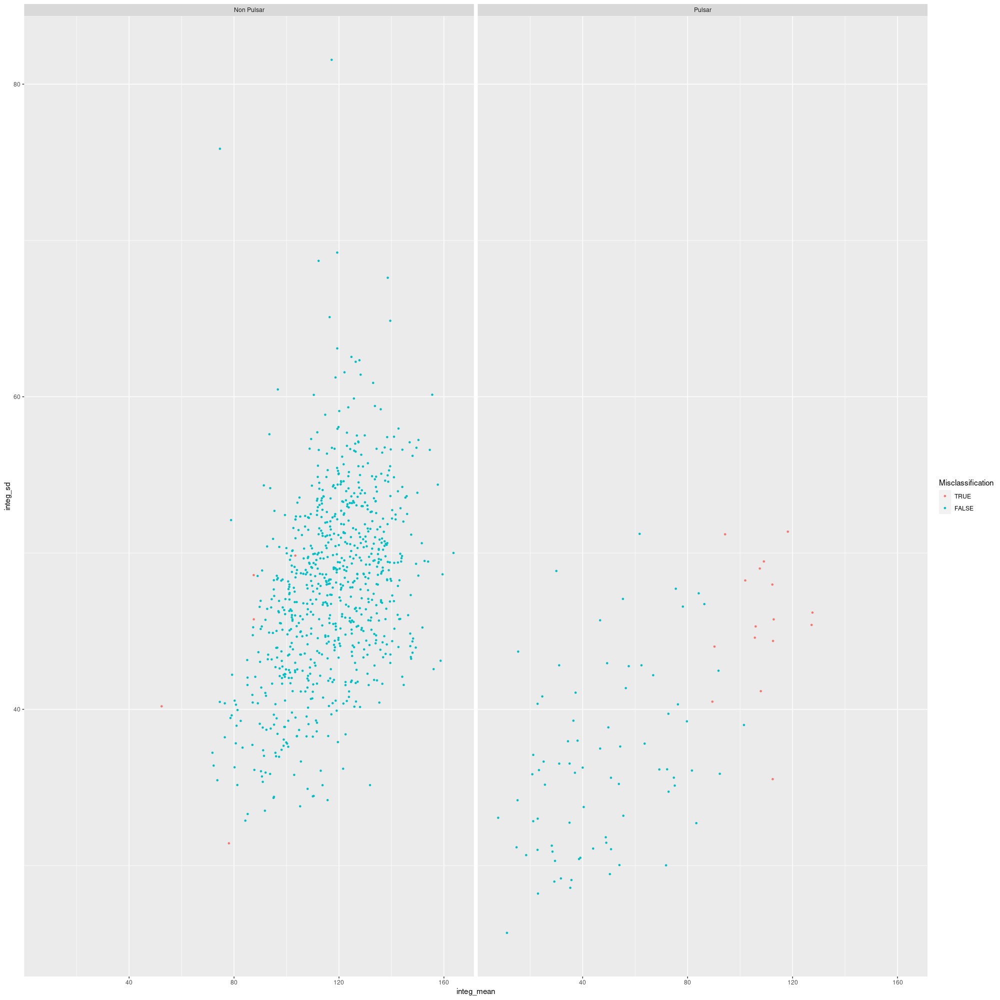

In [43]:
col_index <- names(pulsarTestlog)

pulsarTestlog$misclass <- factor(pulsarTestlog$misclass, levels = c('TRUE', 'FALSE'))

#pulsarTestlog %>% ggplot(aes(Class, fill = misclass)) + geom_bar(position = "stack")

pulsarTestlog %>% rename(x = col_index[1], y = col_index[2]) %>% 
ggplot(aes(x = x, y = y, col = as.factor(misclass))) + geom_point(shape = 20) + facet_grid( ~ Class) + 
scale_color_discrete(name = "Misclassification") + labs(x = col_index[1], y = col_index[2])

In [44]:
library(openssl)
library(hash)
h <- hash(df_pulsar)

Linking to: OpenSSL 1.1.1f  31 Mar 2020

hash-2.2.6.1 provided by Decision Patterns




In [45]:
h

<S4 Type Object>
attr(,".xData")
<environment: 0x55c74082ba00>

In [46]:
rf_fit$results
rf_summary <- summary(rf_fit)
rf_summary

,mtry,Accuracy,Kappa,AccuracySD,KappaSD
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1,0.9777568,0.8576064,0.002453829,0.01395062
2,2,0.9785704,0.8639180,0.002201331,0.01268890


                Length Class      Mode     
call                6  -none-     call     
type                1  -none-     character
predicted        8949  factor     numeric  
err.rate         3000  -none-     numeric  
confusion           6  -none-     numeric  
votes           17898  matrix     numeric  
oob.times        8949  -none-     numeric  
classes             2  -none-     character
importance         32  -none-     numeric  
importanceSD       24  -none-     numeric  
localImportance     0  -none-     NULL     
proximity           0  -none-     NULL     
ntree               1  -none-     numeric  
mtry                1  -none-     numeric  
forest             14  -none-     list     
y                8949  factor     numeric  
test                0  -none-     NULL     
inbag               0  -none-     NULL     
xNames              8  -none-     character
problemType         1  -none-     character
tuneValue           1  data.frame list     
obsLevels           2  -none-   

In [47]:
knn_fit1$results

,k,Accuracy,Kappa,AccuracySD,KappaSD
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,2,0.9701091,0.8146248,0.004168465,0.02436426
2,3,0.9777630,0.8579131,0.002808163,0.01777767
3,4,0.9770364,0.8526425,0.003032257,0.01983387
4,5,0.9768132,0.8499049,0.003060722,0.02000791
5,6,0.9772601,0.8527123,0.003236248,0.02114382
6,7,0.9773719,0.8527162,0.002789026,0.01856533
7,8,0.9767572,0.8484055,0.002459733,0.01642681
8,9,0.9771482,0.8503951,0.002392450,0.01588045
9,10,0.9771482,0.8502244,0.002082422,0.01376896


In [48]:
postResample(log_pred, pulsarTest$Class)
postResample(knn_pred1, pulsarTest$Class)
postResample(rf_pred, pulsarTest$Class)

Accuracy     Kappa 
0.9765363 0.8670538

Accuracy      Kappa 
0.84692737 0.02512423

Accuracy      Kappa 
0.84134078 0.01724405

In [49]:
var_list <- list("Integrated Mean" = "integ_mean", 
                     "Integrated Standard Deviation" = "integ_sd", 
                     "Integrated Kurtosis" = "integ_exkur", 
                     "Intergrated Skew" = "integ_skew",
                     "DMSNR Mean" = "DMSNR_mean", 
                     "DMSNR Standard Deviation" = "DMSNR_sd", 
                     "DMSNR Kurtosis" = "DMSNR_exkur", 
                     "DMSNR Skew" = "DMSNR_skew")

var_pick <- "integ_mean"

print(var_list[var_list != var_pick])

$`Integrated Standard Deviation`
[1] "integ_sd"

$`Integrated Kurtosis`
[1] "integ_exkur"

$`Intergrated Skew`
[1] "integ_skew"

$`DMSNR Mean`
[1] "DMSNR_mean"

$`DMSNR Standard Deviation`
[1] "DMSNR_sd"

$`DMSNR Kurtosis`
[1] "DMSNR_exkur"

$`DMSNR Skew`
[1] "DMSNR_skew"



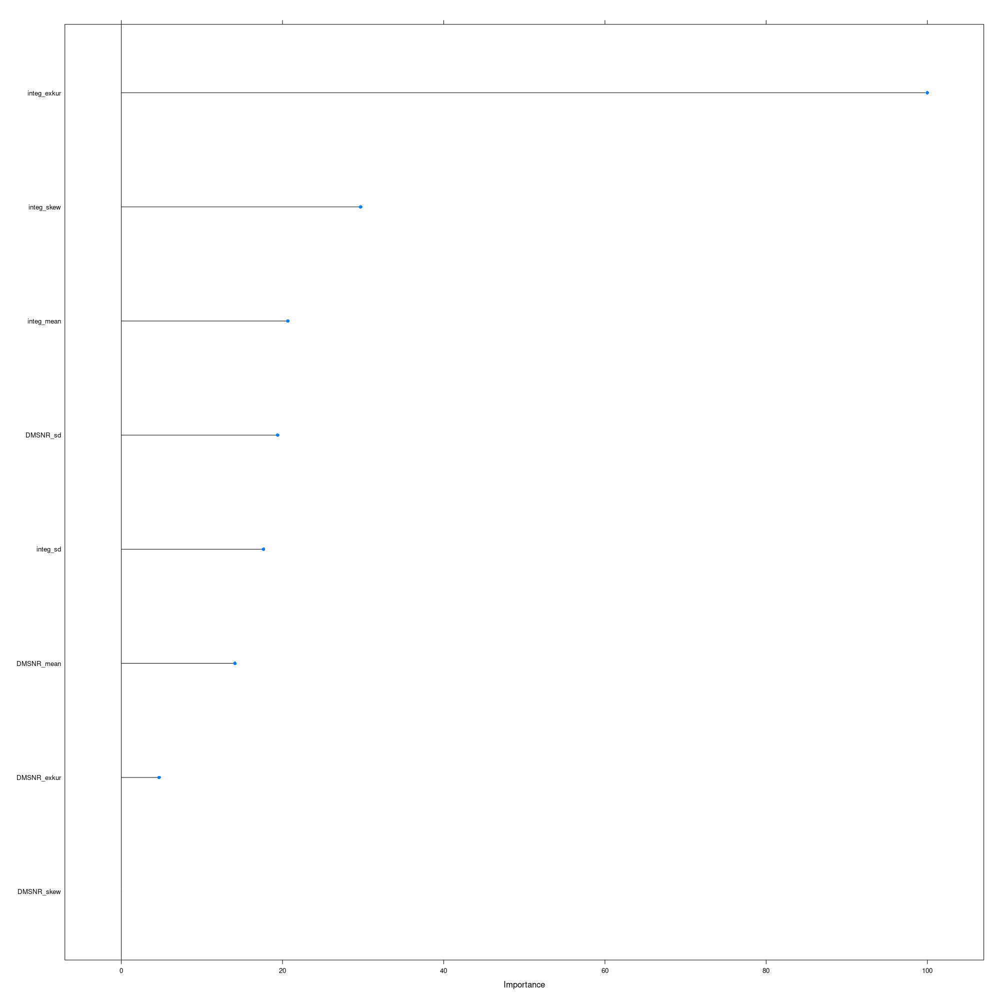

In [50]:
plot(varImp(rf_fit))

In [51]:
point1 <- list("integ_mean" = 100,
               "integ_sd" = 55,
               "integ_exkur" = 0.5, 
               "integ_skew" = 1.0,
               "DMSNR_mean" = 20,
               "DMSNR_sd" = 55,
               "DMSNR_exkur" = 3,
               "DMSNR_skew" = 5)

point1 <- data.frame(point1)

In [52]:
point1

integ_mean,integ_sd,integ_exkur,integ_skew,DMSNR_mean,DMSNR_sd,DMSNR_exkur,DMSNR_skew
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
100,55,0.5,1,20,55,3,5


In [53]:
predict(rf_fit, newdata = point1)

[1] Non Pulsar
Levels: Non Pulsar Pulsar

In [94]:
df_pulsar <- read_csv("HTRU_2.csv", col_names = FALSE)

names(df_pulsar) <- c("integ_mean","integ_sd","integ_exkur","integ_skew",
                      "DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew","Class")

df_pulsar <- df_pulsar %>% select(everything()) %>% mutate(Class = ifelse(Class == 1, "Pulsar", "Non Pulsar"))

df_pulsar$Class <- as.factor(df_pulsar$Class)


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double(),
  X4 = col_double(),
  X5 = col_double(),
  X6 = col_double(),
  X7 = col_double(),
  X8 = col_double(),
  X9 = col_double()
)




In [54]:
sum_stats_total <- df_pulsar %>%  summarise(across(starts_with(c("integ", "DMSNR")), list(mean = mean, max = max, min = min)))

sum_stats_integ <- df_pulsar %>% filter(Class == "Pulsar") %>%  summarise(across(starts_with("integ"), list(mean = mean, max = max, min = min)))
sum_stats_DMSNR <- df_pulsar %>% filter(Class == "Non Pulsar") %>%  summarise(across(starts_with("DMSNR"), list(mean = mean, max = max, min = min)))


── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double(),
  X4 = col_double(),
  X5 = col_double(),
  X6 = col_double(),
  X7 = col_double(),
  X8 = col_double(),
  X9 = col_double()
)




In [55]:
t(sum_stats_total)
sum_stats_integ
sum_stats_DMSNR

integ_mean_mean,111.0799683
integ_mean_max,192.6171875
integ_mean_min,5.8125000
integ_sd_mean,46.5495316
integ_sd_max,98.7789107
integ_sd_min,24.7720418
integ_exkur_mean,0.4778573
integ_exkur_max,8.0695220
integ_exkur_min,-1.8760112
integ_skew_mean,1.7702790
integ_skew_max,68.1016217


integ_mean_mean,integ_mean_max,integ_mean_min,integ_sd_mean,integ_sd_max,integ_sd_min,integ_exkur_mean,integ_exkur_max,integ_exkur_min,integ_skew_mean,integ_skew_max,integ_skew_min
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
56.69061,139.2578,5.8125,38.7106,83.79691,24.77204,3.130655,8.069522,-0.09488784,15.55358,68.10162,-1.139069


DMSNR_mean_mean,DMSNR_mean_max,DMSNR_mean_min,DMSNR_sd_mean,DMSNR_sd_max,DMSNR_sd_min,DMSNR_exkur_mean,DMSNR_exkur_max,DMSNR_exkur_min,DMSNR_skew_mean,DMSNR_skew_max,DMSNR_skew_min
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8.863258,223.3921,0.2132107,23.28798,110.6422,7.370432,8.862674,34.53984,-3.13927,113.6203,1191.001,-1.976976


In [56]:
sum_stats_total <- data.frame(t(sum_stats_total))
row.names(sum_stats_total)
names(sum_stats_total) <- "Values"
sum_stats_total

sum_stats_total$type <- c("mean", "max", "min")

sum_stats_total

[1] "integ_mean_mean"  "integ_mean_max"   "integ_mean_min"   "integ_sd_mean"   
 [5] "integ_sd_max"     "integ_sd_min"     "integ_exkur_mean" "integ_exkur_max" 
 [9] "integ_exkur_min"  "integ_skew_mean"  "integ_skew_max"   "integ_skew_min"  
[13] "DMSNR_mean_mean"  "DMSNR_mean_max"   "DMSNR_mean_min"   "DMSNR_sd_mean"   
[17] "DMSNR_sd_max"     "DMSNR_sd_min"     "DMSNR_exkur_mean" "DMSNR_exkur_max" 
[21] "DMSNR_exkur_min"  "DMSNR_skew_mean"  "DMSNR_skew_max"   "DMSNR_skew_min"

,Values
,<dbl>
integ_mean_mean,111.0799683
integ_mean_max,192.6171875
integ_mean_min,5.8125000
integ_sd_mean,46.5495316
integ_sd_max,98.7789107
integ_sd_min,24.7720418
integ_exkur_mean,0.4778573
integ_exkur_max,8.0695220
integ_exkur_min,-1.8760112


,Values,type
,<dbl>,<chr>
integ_mean_mean,111.0799683,mean
integ_mean_max,192.6171875,max
integ_mean_min,5.8125000,min
integ_sd_mean,46.5495316,mean
integ_sd_max,98.7789107,max
integ_sd_min,24.7720418,min
integ_exkur_mean,0.4778573,mean
integ_exkur_max,8.0695220,max
integ_exkur_min,-1.8760112,min


In [57]:
sum_stats_total <- as_tibble(sum_stats_total, rownames = "attribute")

In [58]:
sum_stats_total %>% pivot_wider(names_from = type, values_from = Values)

attribute,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean_mean,111.0799683,NA,NA
integ_mean_max,NA,192.617188,NA
integ_mean_min,NA,NA,5.8125000
integ_sd_mean,46.5495316,NA,NA
integ_sd_max,NA,98.778911,NA
integ_sd_min,NA,NA,24.7720418
integ_exkur_mean,0.4778573,NA,NA
integ_exkur_max,NA,8.069522,NA
integ_exkur_min,NA,NA,-1.8760112


In [59]:
x <- strsplit(sum_stats_total$attribute, "_")

In [60]:
var_name <- rep("NA", 24)

for(i in 1:24){
    var_name[i] <- paste0(unlist(x[i])[1],"_",unlist(x[i])[2])
}

In [61]:
var_name

[1] "integ_mean"  "integ_mean"  "integ_mean"  "integ_sd"    "integ_sd"   
 [6] "integ_sd"    "integ_exkur" "integ_exkur" "integ_exkur" "integ_skew" 
[11] "integ_skew"  "integ_skew"  "DMSNR_mean"  "DMSNR_mean"  "DMSNR_mean" 
[16] "DMSNR_sd"    "DMSNR_sd"    "DMSNR_sd"    "DMSNR_exkur" "DMSNR_exkur"
[21] "DMSNR_exkur" "DMSNR_skew"  "DMSNR_skew"  "DMSNR_skew"

In [62]:
sum_stats_total$predictor <- var_name

In [63]:
sum_stats_total

attribute,Values,type,predictor
<chr>,<dbl>,<chr>,<chr>
integ_mean_mean,111.0799683,mean,integ_mean
integ_mean_max,192.6171875,max,integ_mean
integ_mean_min,5.8125000,min,integ_mean
integ_sd_mean,46.5495316,mean,integ_sd
integ_sd_max,98.7789107,max,integ_sd
integ_sd_min,24.7720418,min,integ_sd
integ_exkur_mean,0.4778573,mean,integ_exkur
integ_exkur_max,8.0695220,max,integ_exkur
integ_exkur_min,-1.8760112,min,integ_exkur


In [64]:
sum_stats_total %>% select(Values, type, predictor) %>% pivot_wider(names_from = type, values_from = Values)

predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,111.0799683,192.617188,5.8125000
integ_sd,46.5495316,98.778911,24.7720418
integ_exkur,0.4778573,8.069522,-1.8760112
integ_skew,1.7702790,68.101622,-1.7918860
DMSNR_mean,12.6143997,223.392141,0.2132107
DMSNR_sd,26.3265147,110.642211,7.3704322
DMSNR_exkur,8.3035561,34.539844,-3.1392696
DMSNR_skew,104.8577087,1191.000837,-1.9769756


In [65]:
sum_stats_total <- df_pulsar %>%  summarise(across(starts_with(c("integ", "DMSNR")), list(mean = mean, max = max, min = min)))
sum_stats_total <- t(sum_stats_total)

sum_stats_total  <- as_tibble(sum_stats_total, rownames = "attribute")

names(sum_stats_total)[2] <- "Values"

sum_stats_total$type <- rep(c("mean", "max", "min"),8)

var_name <- rep("NA", 24)

x <- sum_stats_total$attribute

for(i in 1:24){
    var_name[i] <- paste0(unlist(strsplit(x, "_")[i])[1], "_", unlist(strsplit(x, "_")[i])[2])
}

sum_stats_total$predictor <- var_name
sum_stats_total

sum_stats_total %>% select(Values, type, predictor) %>% pivot_wider(names_from = type, values_from = Values)

attribute,Values,type,predictor
<chr>,<dbl>,<chr>,<chr>
integ_mean_mean,111.0799683,mean,integ_mean
integ_mean_max,192.6171875,max,integ_mean
integ_mean_min,5.8125000,min,integ_mean
integ_sd_mean,46.5495316,mean,integ_sd
integ_sd_max,98.7789107,max,integ_sd
integ_sd_min,24.7720418,min,integ_sd
integ_exkur_mean,0.4778573,mean,integ_exkur
integ_exkur_max,8.0695220,max,integ_exkur
integ_exkur_min,-1.8760112,min,integ_exkur


predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,111.0799683,192.617188,5.8125000
integ_sd,46.5495316,98.778911,24.7720418
integ_exkur,0.4778573,8.069522,-1.8760112
integ_skew,1.7702790,68.101622,-1.7918860
DMSNR_mean,12.6143997,223.392141,0.2132107
DMSNR_sd,26.3265147,110.642211,7.3704322
DMSNR_exkur,8.3035561,34.539844,-3.1392696
DMSNR_skew,104.8577087,1191.000837,-1.9769756


In [90]:
sum_stats_total <- df_pulsar %>%  summarise(across(starts_with(c("integ", "DMSNR")), list(mean = mean, max = max, min = min)))
sum_stats_total <- t(sum_stats_total)

sum_stats_pulsar <- df_pulsar %>% filter(Class == "Pulsar") %>% summarise(across(starts_with(c("integ", "DMSNR")), list(mean = mean, max = max, min = min)))
sum_stats_pulsar <- t(sum_stats_pulsar)

sum_stats_non_puls <- df_pulsar %>% filter(Class == "Non Pulsar") %>% summarise(across(starts_with(c("integ", "DMSNR")), list(mean = mean, max = max, min = min)))
sum_stats_non_puls <- t(sum_stats_non_puls)

sum_stats_total  <- as_tibble(sum_stats_total, rownames = "attribute", .name_repair = "unique")
sum_stats_pulsar  <- as_tibble(sum_stats_pulsar, rownames = "attribute", .name_repair = "unique")
sum_stats_non_puls  <- as_tibble(sum_stats_non_puls, rownames = "attribute", .name_repair = "unique")

sum_stats_total <- sum_stats_total %>% rename(Values = ...1) %>% separate(attribute, into = c("name1", "name2" , "type"), sep = "_") %>% 
  mutate(predictor = paste0(name1, "_", name2)) %>% dplyr::select(type, Values, predictor) %>% 
  pivot_wider(names_from = type, values_from = Values)

sum_stats_pulsar <- sum_stats_pulsar %>% rename(Values = ...1) %>% separate(attribute, into = c("name1", "name2" , "type"), sep = "_") %>% 
  mutate(predictor = paste0(name1, "_", name2)) %>% dplyr::select(type, Values, predictor) %>% 
  pivot_wider(names_from = type, values_from = Values)

sum_stats_non_puls <- sum_stats_non_puls %>% rename(Values = ...1) %>% separate(attribute, into = c("name1", "name2" , "type"), sep = "_") %>% 
  mutate(predictor = paste0(name1, "_", name2)) %>% dplyr::select(type, Values, predictor) %>% 
  pivot_wider(names_from = type, values_from = Values)


sum_stats_total
sum_stats_pulsar
sum_stats_non_puls

New names:
* `` -> ...1

New names:
* `` -> ...1

New names:
* `` -> ...1



predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,111.0799683,192.617188,5.8125000
integ_sd,46.5495316,98.778911,24.7720418
integ_exkur,0.4778573,8.069522,-1.8760112
integ_skew,1.7702790,68.101622,-1.7918860
DMSNR_mean,12.6143997,223.392141,0.2132107
DMSNR_sd,26.3265147,110.642211,7.3704322
DMSNR_exkur,8.3035561,34.539844,-3.1392696
DMSNR_skew,104.8577087,1191.000837,-1.9769756


predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,56.690608,139.257812,5.81250000
integ_sd,38.710598,83.796909,24.77204176
integ_exkur,3.130655,8.069522,-0.09488784
integ_skew,15.553576,68.101622,-1.13906886
DMSNR_mean,49.825995,199.577759,0.48662207
DMSNR_sd,56.468963,109.655345,7.65862281
DMSNR_exkur,2.757069,30.883882,-1.86231995
DMSNR_skew,17.931728,1017.383180,-1.87468319


predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,116.5627263,192.617188,17.2109375
integ_sd,47.3397408,98.778911,28.6987145
integ_exkur,0.2104401,4.785786,-1.8760112
integ_skew,0.3808440,24.872429,-1.7918860
DMSNR_mean,8.8632584,223.392141,0.2132107
DMSNR_sd,23.2879839,110.642211,7.3704322
DMSNR_exkur,8.8626737,34.539844,-3.1392696
DMSNR_skew,113.6203437,1191.000837,-1.9769756


In [91]:
sum_stats_total
sum_stats_pulsar
sum_stats_non_puls

predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,111.0799683,192.617188,5.8125000
integ_sd,46.5495316,98.778911,24.7720418
integ_exkur,0.4778573,8.069522,-1.8760112
integ_skew,1.7702790,68.101622,-1.7918860
DMSNR_mean,12.6143997,223.392141,0.2132107
DMSNR_sd,26.3265147,110.642211,7.3704322
DMSNR_exkur,8.3035561,34.539844,-3.1392696
DMSNR_skew,104.8577087,1191.000837,-1.9769756


predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,56.690608,139.257812,5.81250000
integ_sd,38.710598,83.796909,24.77204176
integ_exkur,3.130655,8.069522,-0.09488784
integ_skew,15.553576,68.101622,-1.13906886
DMSNR_mean,49.825995,199.577759,0.48662207
DMSNR_sd,56.468963,109.655345,7.65862281
DMSNR_exkur,2.757069,30.883882,-1.86231995
DMSNR_skew,17.931728,1017.383180,-1.87468319


predictor,mean,max,min
<chr>,<dbl>,<dbl>,<dbl>
integ_mean,116.5627263,192.617188,17.2109375
integ_sd,47.3397408,98.778911,28.6987145
integ_exkur,0.2104401,4.785786,-1.8760112
integ_skew,0.3808440,24.872429,-1.7918860
DMSNR_mean,8.8632584,223.392141,0.2132107
DMSNR_sd,23.2879839,110.642211,7.3704322
DMSNR_exkur,8.8626737,34.539844,-3.1392696
DMSNR_skew,113.6203437,1191.000837,-1.9769756


In [97]:
print(df_pulsar)
summary(df_pulsar)

df_pulsar2 <- df_pulsar %>% mutate_at(names(df_pulsar)[1:8], ~(scale(.) %>% as.vector))

print(df_pulsar2)
summary(df_pulsar2)

# A tibble: 17,898 x 9
   integ_mean integ_sd integ_exkur integ_skew DMSNR_mean DMSNR_sd DMSNR_exkur
        <dbl>    <dbl>       <dbl>      <dbl>      <dbl>    <dbl>       <dbl>
 1      141.      55.7     -0.235      -0.700      3.20     19.1         7.98
 2      103.      58.9      0.465      -0.515      1.68     14.9        10.6 
 3      103.      39.3      0.323       1.05       3.12     21.7         7.74
 4      137.      57.2     -0.0684     -0.636      3.64     21.0         6.90
 5       88.7     40.7      0.601       1.12       1.18     11.5        14.3 
 6       93.6     46.7      0.532       0.417      1.64     14.5        10.6 
 7      119.      48.8      0.0315     -0.112      0.999     9.28       19.2 
 8      130.      39.8     -0.158       0.390      1.22     14.4        13.5 
 9      107.      52.6      0.453       0.170      2.33     14.5         9.00
10      107.      39.5      0.466       1.16       4.08     25.0         7.40
# … with 17,888 more rows, and 2 more var

   integ_mean         integ_sd      integ_exkur        integ_skew     
 Min.   :  5.812   Min.   :24.77   Min.   :-1.8760   Min.   :-1.7919  
 1st Qu.:100.930   1st Qu.:42.38   1st Qu.: 0.0271   1st Qu.:-0.1886  
 Median :115.078   Median :46.95   Median : 0.2232   Median : 0.1987  
 Mean   :111.080   Mean   :46.55   Mean   : 0.4779   Mean   : 1.7703  
 3rd Qu.:127.086   3rd Qu.:51.02   3rd Qu.: 0.4733   3rd Qu.: 0.9278  
 Max.   :192.617   Max.   :98.78   Max.   : 8.0695   Max.   :68.1016  
   DMSNR_mean          DMSNR_sd       DMSNR_exkur       DMSNR_skew      
 Min.   :  0.2132   Min.   :  7.37   Min.   :-3.139   Min.   :  -1.977  
 1st Qu.:  1.9231   1st Qu.: 14.44   1st Qu.: 5.782   1st Qu.:  34.961  
 Median :  2.8018   Median : 18.46   Median : 8.434   Median :  83.065  
 Mean   : 12.6144   Mean   : 26.33   Mean   : 8.304   Mean   : 104.858  
 3rd Qu.:  5.4643   3rd Qu.: 28.43   3rd Qu.:10.703   3rd Qu.: 139.309  
 Max.   :223.3921   Max.   :110.64   Max.   :34.540   Max.   :119

# A tibble: 17,898 x 9
   integ_mean integ_sd integ_exkur integ_skew DMSNR_mean DMSNR_sd DMSNR_exkur
        <dbl>    <dbl>       <dbl>      <dbl>      <dbl>    <dbl>       <dbl>
 1      1.15    1.33       -0.670     -0.400      -0.319  -0.371      -0.0728
 2     -0.334   1.80       -0.0118    -0.371      -0.371  -0.589       0.504 
 3     -0.314  -1.05       -0.145     -0.117      -0.322  -0.235      -0.126 
 4      1.00    1.55       -0.513     -0.390      -0.304  -0.276      -0.312 
 5     -0.871  -0.859       0.116     -0.105      -0.388  -0.763       1.32  
 6     -0.683   0.0217      0.0508    -0.219      -0.372  -0.605       0.514 
 7      0.328   0.324      -0.420     -0.305      -0.394  -0.876       2.42  
 8      0.752  -0.980      -0.598     -0.224      -0.387  -0.614       1.16  
 9     -0.149   0.888      -0.0237    -0.259      -0.349  -0.608       0.155 
10     -0.149  -1.03       -0.0113    -0.0985     -0.290  -0.0691     -0.201 
# … with 17,888 more rows, and 2 more var

   integ_mean         integ_sd         integ_exkur          integ_skew     
 Min.   :-4.1035   Min.   :-3.18236   Min.   :-2.212200   Min.   :-0.5775  
 1st Qu.:-0.3957   1st Qu.:-0.60988   1st Qu.:-0.423630   1st Qu.:-0.3176  
 Median : 0.1559   Median : 0.05815   Median :-0.239293   Median :-0.2548  
 Mean   : 0.0000   Mean   : 0.00000   Mean   : 0.000000   Mean   : 0.0000  
 3rd Qu.: 0.6239   3rd Qu.: 0.65374   3rd Qu.:-0.004259   3rd Qu.:-0.1366  
 Max.   : 3.1785   Max.   : 7.63232   Max.   : 7.134757   Max.   :10.7543  
   DMSNR_mean         DMSNR_sd        DMSNR_exkur         DMSNR_skew     
 Min.   :-0.4208   Min.   :-0.9736   Min.   :-2.53941   Min.   :-1.0030  
 1st Qu.:-0.3628   1st Qu.:-0.6106   1st Qu.:-0.55970   1st Qu.:-0.6562  
 Median :-0.3329   Median :-0.4040   Median : 0.02884   Median :-0.2046  
 Mean   : 0.0000   Mean   : 0.0000   Mean   : 0.00000   Mean   : 0.0000  
 3rd Qu.:-0.2426   3rd Qu.: 0.1079   3rd Qu.: 0.53248   3rd Qu.: 0.3234  
 Max.   : 7.1516   Max. 

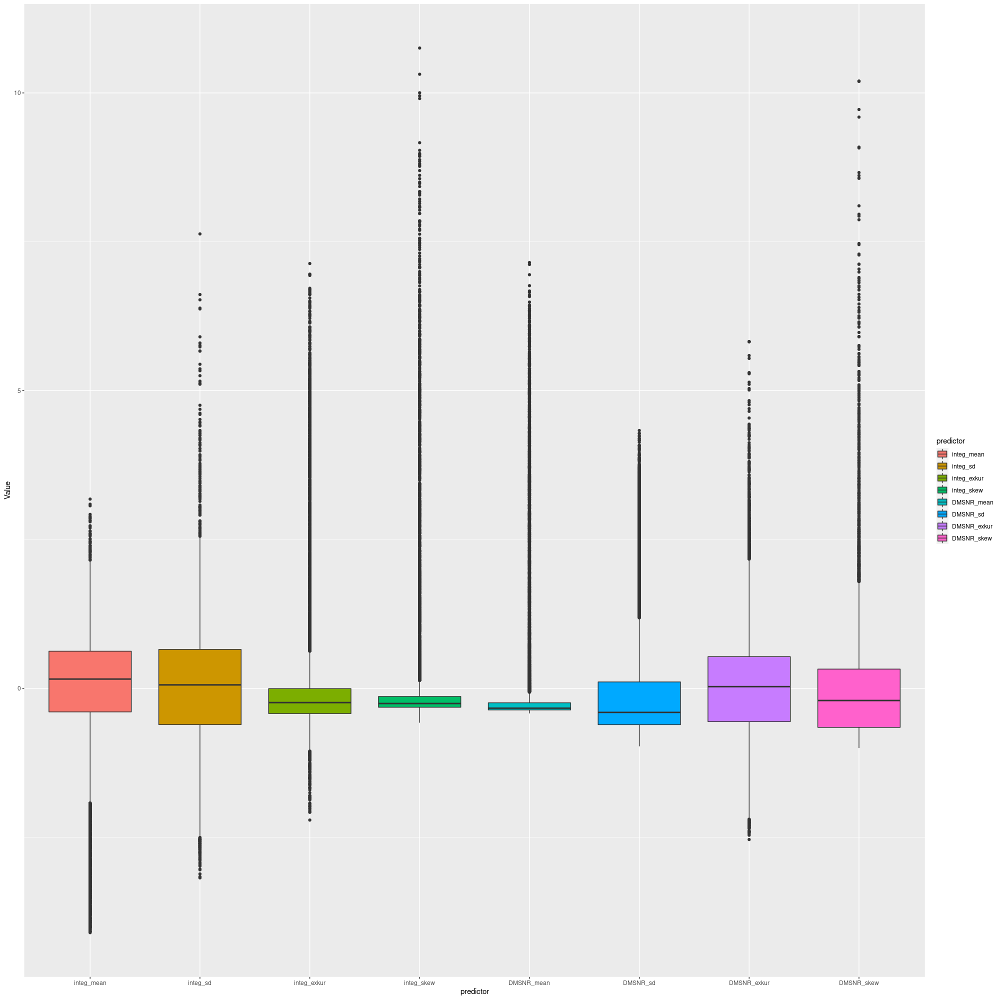

In [118]:
df_pulsar2 %>% pivot_longer(cols = starts_with(c("integ", "DMSNR")), names_to = "predictor", values_to = "Value") %>% 
mutate(predictor = factor(predictor, levels = c("integ_mean","integ_sd","integ_exkur","integ_skew","DMSNR_mean","DMSNR_sd","DMSNR_exkur","DMSNR_skew"))) %>%
ggplot(aes(x = predictor, y = Value, fill = predictor)) + geom_boxplot() #+ scale_fill_manual(values = dense_colors) + facet_grid( ~ Class)

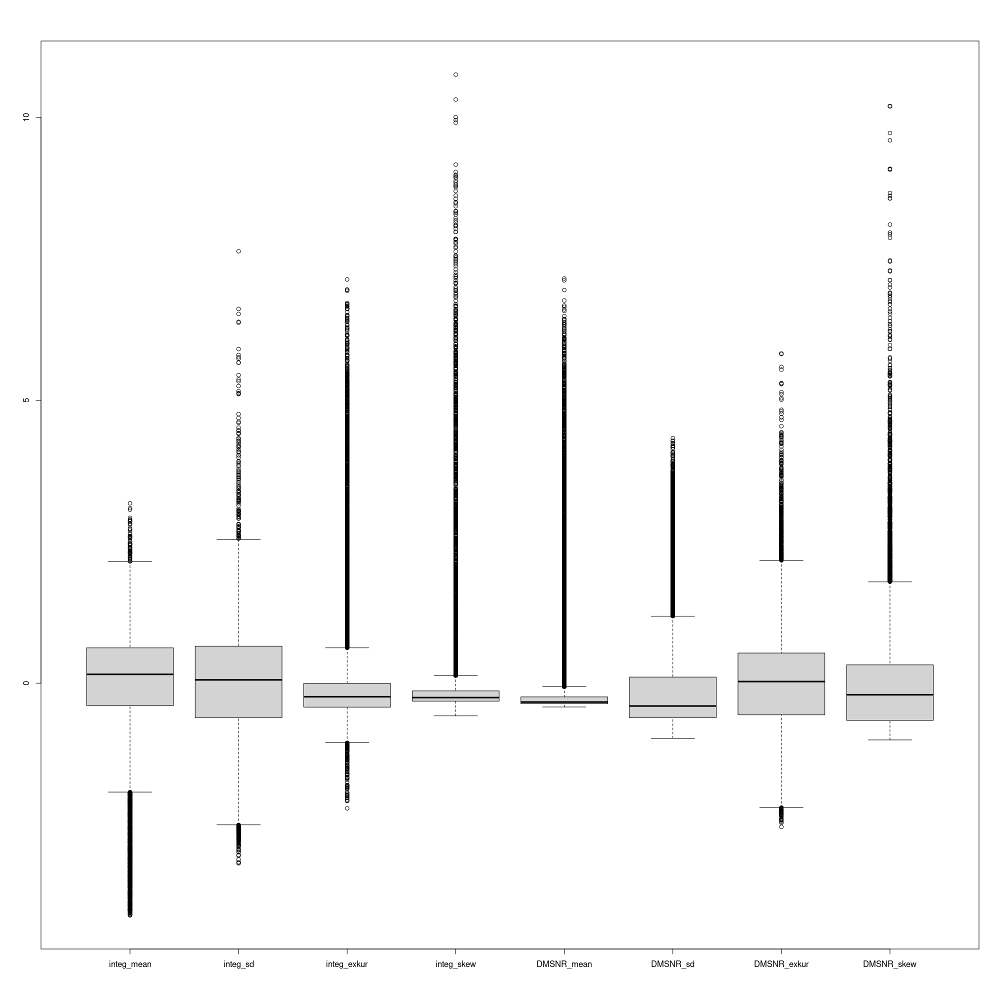

In [102]:
boxplot(df_pulsar2[1:8])